In [2]:
import numpy as np
import matplotlib.pyplot as plt
import hydrodynamics
import LE4PD_XYZ
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes

In [14]:
traj = np.load('../unformatted_traj.npy')
print(traj.shape)

(228, 5000000)


In [5]:
Q = np.load('../10ns/com_Rmatrix.npy')
QHAINV = np.load('../10ns/com_HCINVmatrix.npy')

xi = np.matmul(Q.T, traj[:,:50000])

for i in range(xi.shape[0]):
    xi[i,:] = xi[i,:] - xi.mean(1)[i]

In [ ]:
for i in [100]: #[50, 200, 300, 400, 500, 600, 700, 800, 900]:
    print(i)
    np.save('../' + str(i) + 'ns/unformatted_traj.npy', traj[:,:int(5*1000*i)])

In [ ]:
#If using the large-shared node, there is enough memory to perform this matrix multiplication,
#even for the 1 microsecond simulation.
for k in [50, 100, 200, 300, 400, 500, 600, 700, 800, 900]:
    print(k)
    dtraj = np.copy(traj[:,:int(5*1000*k)])
    avg_coor = traj[:,:int(5*1000*k)].mean(1)
    for i in range(traj.shape[0]):
        dtraj[i,:] = traj[i,:int(5*1000*k)] - avg_coor[i]
    covar = np.matmul(dtraj, (dtraj).T) / (dtraj).shape[1]
    eigvals, R = np.linalg.eigh(covar)
    R_sorted = R[:,np.argsort(1/abs(eigvals))]
    np.save('../' + str(k) + 'ns/com_covariance_matrix.npy', covar)
    np.savetxt('../' + str(k) + 'ns/com_covariance_matrix.dat', covar.ravel())
    np.save('../' + str(k) + 'ns/com_Rmatrix.npy', R_sorted)
    np.save('../' + str(k) + 'ns/com_RTmatrix.npy', R_sorted.T)
    np.savetxt('../' + str(k) + 'ns/com_covar_eig', eigvals[np.argsort(1/abs(eigvals))])

In [41]:
#Short 

for i in [1, 10, 25]:
    print(i)
    np.save('../' + str(i) + 'ns/unformatted_traj.npy', traj[:,:int(5*1000*i)])

1
10
25


In [42]:
#Short

for k in [1, 10, 25]:
    print(k)
    dtraj = np.copy(traj[:,:int(5*1000*k)])
    avg_coor = traj[:,:int(5*1000*k)].mean(1)
    for i in range(traj.shape[0]):
        dtraj[i,:] = traj[i,:int(5*1000*k)] - avg_coor[i]
    covar = np.matmul(dtraj, (dtraj).T) / (dtraj).shape[1]
    eigvals, R = np.linalg.eigh(covar)
    R_sorted = R[:,np.argsort(1/abs(eigvals))]
    np.save('../' + str(k) + 'ns/com_covariance_matrix.npy', covar)
    np.savetxt('../' + str(k) + 'ns/com_covariance_matrix.dat', covar.ravel())
    np.save('../' + str(k) + 'ns/com_Rmatrix.npy', R_sorted)
    np.save('../' + str(k) + 'ns/com_RTmatrix.npy', R_sorted.T)
    np.savetxt('../' + str(k) + 'ns/com_covar_eig', eigvals[np.argsort(1/abs(eigvals))])

1
10
25


In [15]:
for i in [50, 100, 200, 300, 400, 500, 600, 700, 800, 900]:
    print(i)
    hydrodynamics.Rij(traj[:,:int(5*1000*i)], path = '../' + str(int(i)) + 'ns/')
    hydrodynamics.fric_calc(traj[:,:int(5*1000*50)], '../top.pdb', T = 300, viscosity=0, path_to_resarea = '../' + str(int(i)) + 'ns/')

50
76 250000
76 250000
fratio:  0.21091194690583234
Temperature (K):  300
Internal viscosity factor:  2.71828
No viscosity given. Using the NIST formula, which is only valid for physiological conditions,

i.e. between about 273 and 310 K.
Viscosity (Pa s):  0.0008518364365438791
fd20 0.0
100
76 500000
76 250000
fratio:  0.21090913838460512
Temperature (K):  300
Internal viscosity factor:  2.71828
No viscosity given. Using the NIST formula, which is only valid for physiological conditions,

i.e. between about 273 and 310 K.
Viscosity (Pa s):  0.0008518364365438791
fd20 0.0
200
76 1000000
76 250000
fratio:  0.21097770168003754
Temperature (K):  300
Internal viscosity factor:  2.71828
No viscosity given. Using the NIST formula, which is only valid for physiological conditions,

i.e. between about 273 and 310 K.
Viscosity (Pa s):  0.0008518364365438791
fd20 0.0
300
76 1500000
76 250000
fratio:  0.21077748945812053
Temperature (K):  300
Internal viscosity factor:  2.71828
No viscosity given

In [16]:
#Short 

for i in [1, 10, 25]:
    print(i)
    hydrodynamics.Rij(traj[:,:int(5*1000*i)], path = '../' + str(int(i)) + 'ns/')
    hydrodynamics.fric_calc(traj[:,:int(5*1000*50)], '../top.pdb', T = 300, viscosity=0, path_to_resarea = '../' + str(int(i)) + 'ns/')

1
76 5000
76 250000
fratio:  0.20937380669825392
Temperature (K):  300
Internal viscosity factor:  2.71828
No viscosity given. Using the NIST formula, which is only valid for physiological conditions,

i.e. between about 273 and 310 K.
Viscosity (Pa s):  0.0008518364365438791
fd20 0.0
10
76 50000
76 250000
fratio:  0.2103110257552904
Temperature (K):  300
Internal viscosity factor:  2.71828
No viscosity given. Using the NIST formula, which is only valid for physiological conditions,

i.e. between about 273 and 310 K.
Viscosity (Pa s):  0.0008518364365438791
fd20 0.0
25
76 125000
76 250000
fratio:  0.2104487082924623
Temperature (K):  300
Internal viscosity factor:  2.71828
No viscosity given. Using the NIST formula, which is only valid for physiological conditions,

i.e. between about 273 and 310 K.
Viscosity (Pa s):  0.0008518364365438791
fd20 0.0


In [3]:
for i in [50, 100, 200, 300, 400, 500, 600, 700, 800, 900]:
    print(i)
    LE4PD_XYZ.eigendecomp(76, path='../' + str(i) + 'ns/')
print(1000)
LE4PD_XYZ.eigendecomp(76, path='../')

50


/oasis/projects/nsf/uoo104/ebeyerle/1UBQ-extend/PCA/notebooks/LE4PD_XYZ.py:290: ComplexWarning: Casting complex values to real discards the imaginary part
  QMO[:,i]=eigvec[:,order[i]]


100
200
300
400
500
600
Q is a singular matrix
700
800
900
1000


In [18]:
for i in [1, 10, 25]:
    print(i)
    LE4PD_XYZ.eigendecomp(76, path='../' + str(i) + 'ns/')
print(1000)
LE4PD_XYZ.eigendecomp(76, path='../')

1
10
25
1000


In [ ]:
times = [50, 100, 200, 400, 600, 800, 1000]
colors = plt.cm.cool(np.linspace(0, 1, len(times)))
fig, ax0 = plt.subplots()
axins = inset_axes(ax0, width = 1.6, height = 1, loc = 'upper right')

for n, i in enumerate(times):
    if i == 1000:
        eigvals = np.loadtxt('../com_covar_eig')
    else:
        eigvals = np.loadtxt('../' + str(i) + 'ns/com_covar_eig')
                     
    ax0.plot(np.arange(1, 223), eigvals[:-6], lw = 2, c = colors[n], label = str(i) + 'ns')
    axins.plot(np.arange(1, 11), eigvals[:10], lw = 2, c = colors[n], label = str(i + 1))
ax0.set_xlabel('Mode', fontsize = 16)
ax0.set_ylabel(r'$\mu_a^{-1}$, nm$^2$', fontsize = 16)
ax0.tick_params(labelsize = 12)
ax0.set_xscale('log')
ax0.set_yscale('log')
#ax0.set_yticks(size = 12)
axins.set_xticks([1, 3, 5, 7, 9])
ax0.legend(loc = 'lower left')
plt.savefig('figures/eigvals_change_time.pdf', dpi = 300)
plt.show()
plt.close()

/home/ebeyerle/bin/anaconda3/envs/pyemma_tutorials/lib/python3.7/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


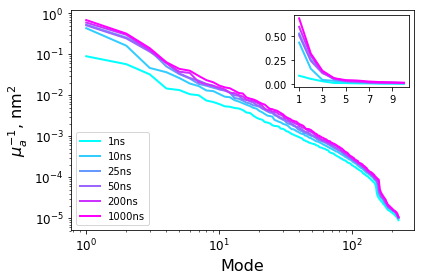

In [4]:
#Short

times = [1, 10, 25, 50, 200, 1000]
colors = plt.cm.cool(np.linspace(0, 1, len(times)))
fig, ax0 = plt.subplots()
axins = inset_axes(ax0, width = 1.6, height = 1, loc = 'upper right')

for n, i in enumerate(times):
    if i == 1000:
        eigvals = np.loadtxt('../com_covar_eig')
    else:
        eigvals = np.loadtxt('../' + str(i) + 'ns/com_covar_eig')
                     
    ax0.plot(np.arange(1, 223), eigvals[:-6], lw = 2, c = colors[n], label = str(i) + 'ns')
    axins.plot(np.arange(1, 11), eigvals[:10], lw = 2, c = colors[n], label = str(i + 1))
ax0.set_xlabel('Mode', fontsize = 16)
ax0.set_ylabel(r'$\mu_a^{-1}$, nm$^2$', fontsize = 16)
ax0.tick_params(labelsize = 12)
ax0.set_xscale('log')
ax0.set_yscale('log')
#ax0.set_yticks(size = 12)
axins.set_xticks([1, 3, 5, 7, 9])
ax0.legend(loc = 'lower left')
plt.tight_layout()
plt.savefig('figures/eigvals_converge_short.pdf', dpi = 300)
plt.show()
plt.close()

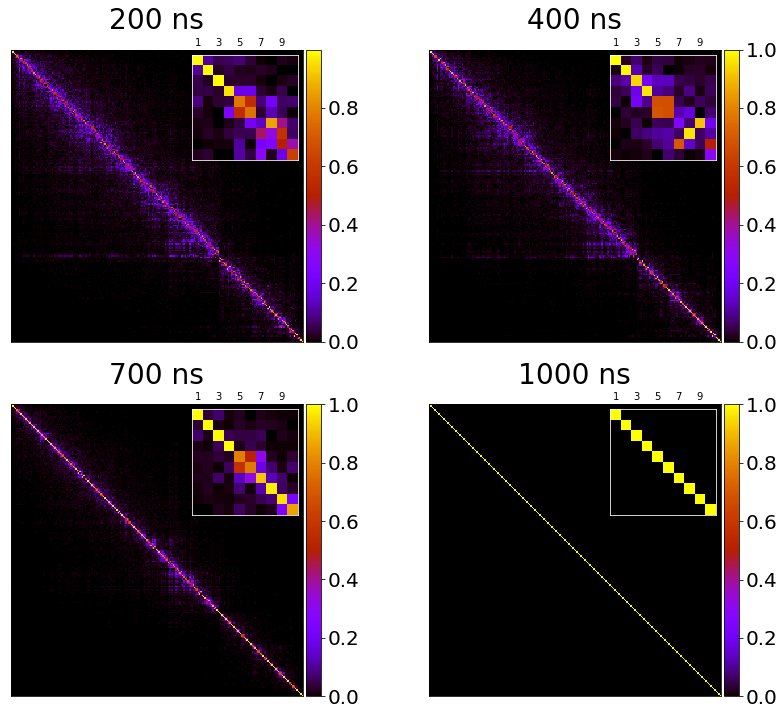

In [33]:
# Figure 2 -- Eigenvector convergence

QT = np.reshape(np.loadtxt('../com_Rmatrix'), (228, 228)).T

Q = np.load('../200ns/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax0.set_title('200 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../400ns/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax1.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax1.set_title('400 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../700ns/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax2.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax2.set_title('700 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.reshape(np.loadtxt('../com_Rmatrix'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax3.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax3.set_title('1000 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_converge.pdf', dpi = 300)
plt.show()
plt.close()

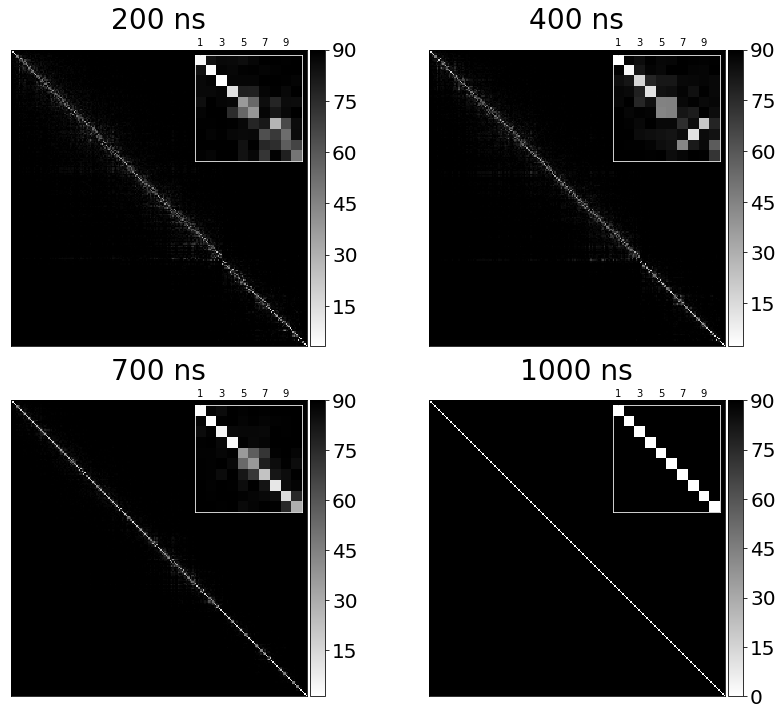

In [34]:
# Figure 2 -- Eigenvector convergence

QT = np.reshape(np.loadtxt('../com_Rmatrix'), (228, 228)).T

Q = np.load('../200ns/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        if abs(overlap[i, j]) >= 1: overlap[i,j] = 0.99999999999999999
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0, 15, 30, 45, 60, 75, 90]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(np.rad2deg(np.arccos(abs(overlap))), cmap = 'binary')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(np.rad2deg(np.arccos(abs(overlap)))[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
axins.set_yticks([])
ax0.set_title('200 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../400ns/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        if abs(overlap[i, j]) >= 1: overlap[i,j] = 0.99999999999999999
        
im=ax1.matshow(np.rad2deg(np.arccos(abs(overlap))),cmap = 'binary')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(np.rad2deg(np.arccos(abs(overlap)))[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
axins.set_yticks([])
ax1.set_title('400 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../700ns/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        if abs(overlap[i, j]) >= 1: overlap[i,j] = 0.99999999999999999
        
im=ax2.matshow(np.rad2deg(np.arccos(abs(overlap))),cmap = 'binary')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(np.rad2deg(np.arccos(abs(overlap)))[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
axins.set_yticks([])
ax2.set_title('700 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.reshape(np.loadtxt('../com_Rmatrix'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        if abs(overlap[i, j]) >= 1: overlap[i,j] = 0.99999999999999999
        
im=ax3.matshow(np.rad2deg(np.arccos(abs(overlap))),cmap = 'binary')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(np.rad2deg(np.arccos(abs(overlap)))[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.set_yticks([])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax3.set_title('1000 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/cosine_converge.pdf', dpi = 300)
plt.show()
plt.close()

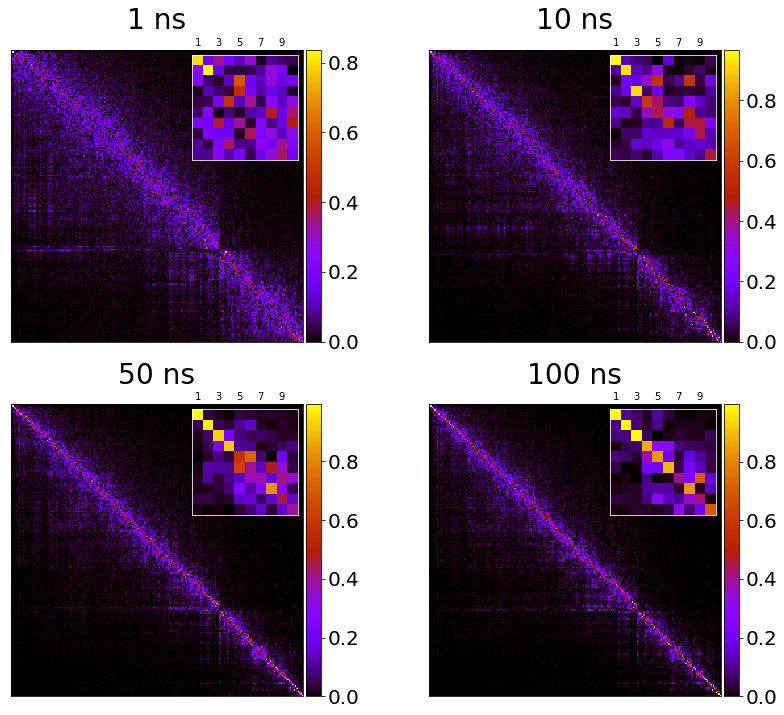

In [35]:
# Short

QT = np.reshape(np.loadtxt('../com_Rmatrix'), (228, 228)).T

Q = np.load('../1ns/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax0.set_title('1 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../10ns/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax1.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax1.set_title('10 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../50ns/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax2.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax2.set_title('50 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.reshape(np.loadtxt('../100ns/com_Rmatrix'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax3.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax3.set_title('100 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_converge_short.pdf', dpi = 300)
plt.show()
plt.close()

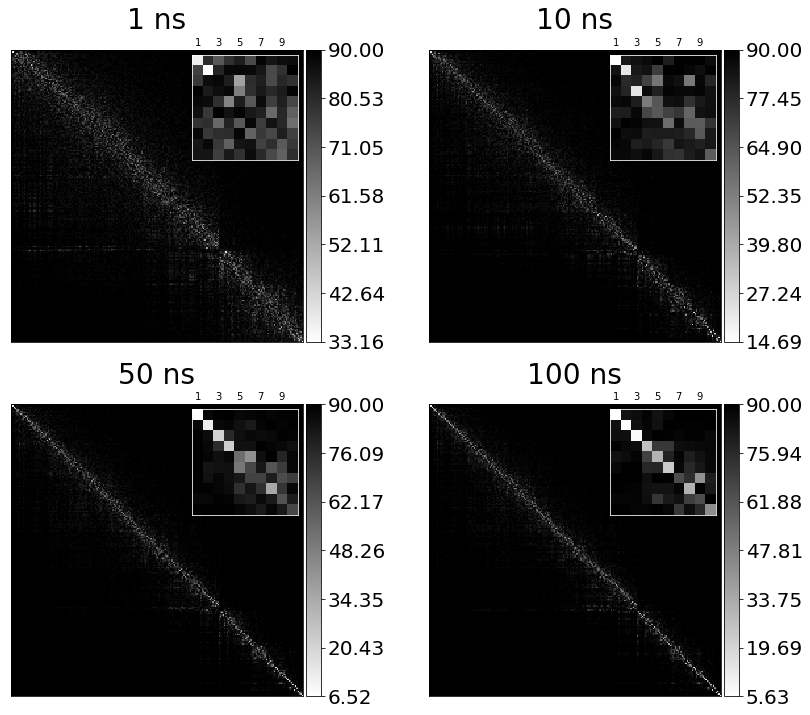

In [36]:
# Short

QT = np.reshape(np.loadtxt('../com_Rmatrix'), (228, 228)).T

Q = np.load('../1ns/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(cosine, cmap = 'binary')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax0.set_title('1 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
tics = list(np.linspace(cosine.min(), cosine.max(), 7))
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../10ns/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
im = ax1.matshow(cosine, cmap = 'binary')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax1.set_title('10 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
tics = list(np.linspace(cosine.min(), cosine.max(), 7))
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../50ns/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
im = ax2.matshow(cosine, cmap = 'binary')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax2.set_title('50 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
tics = list(np.linspace(cosine.min(), cosine.max(), 7))
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.reshape(np.loadtxt('../100ns/com_Rmatrix'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
im=ax3.matshow(cosine,cmap = 'binary')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax3.set_title('100 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
tics = list(np.linspace(cosine.min(), cosine.max(), 7))
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/cosine_converge_short.pdf', dpi = 300)
plt.show()
plt.close()

In [215]:
#Local mode lengthscales

N = 76
lml_list = []

for i in times:
    print(i)
    if i != 1000:
        Q = np.load('../' + str(i) + 'ns/com_Rmatrix.npy')
        eigvals = abs(np.loadtxt('../'  +str(i) + 'ns/com_covar_eig'))
    else:
        Q = np.reshape(np.loadtxt('../com_Rmatrix'), (3*N, 3*N))
        eigvals = abs(np.loadtxt('../com_covar_eig'))
        
    Qx = Q[::3,:]
    Qy = Q[1::3,:]
    Qz = Q[2::3,:]
    
    lml = np.zeros((N, 3*N))
    
    for j in range(N):
        lml[j,:] = 10*np.sqrt(((Qx[j,:]**2 + Qy[j,:]**2 + Qz[j,:]**2))*eigvals[:])
        
    lml_list.append(lml)

50
100
200
400
600
800
1000


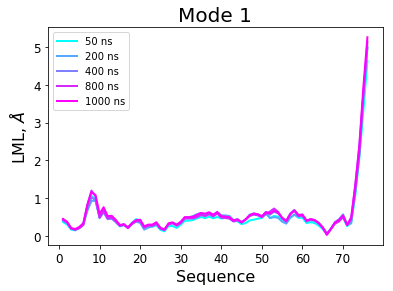

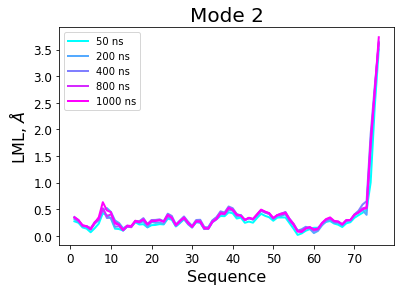

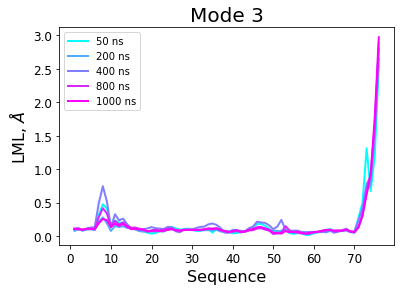

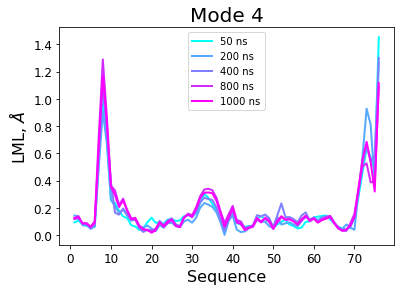

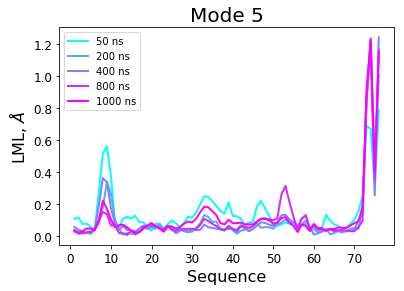

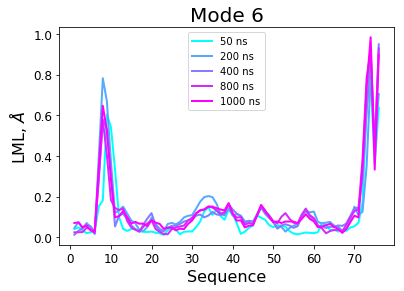

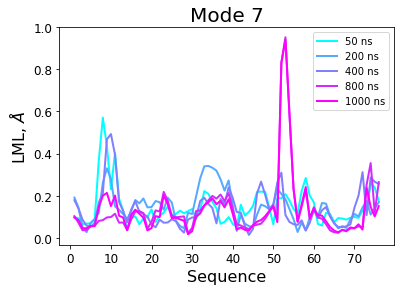

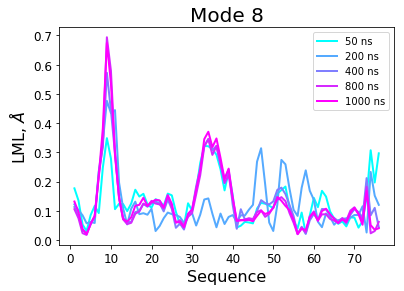

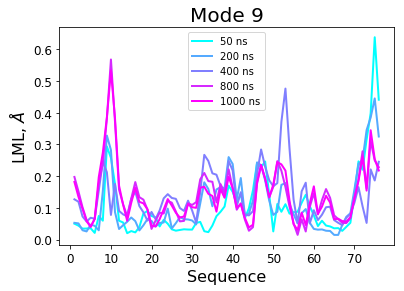

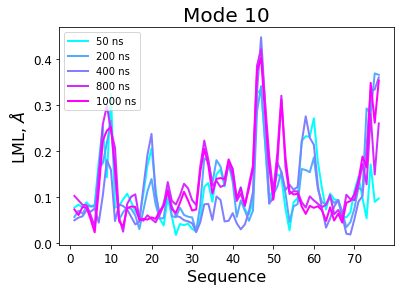

In [216]:
selected = np.array([50, 200, 400, 800, 1000])

for a in range(10):
    for n, i in enumerate(times):
        if np.any(selected == i):
            plt.plot(np.arange(1, N + 1), lml_list[n][:,a], lw = 2, c = colors[n], label = str(i) + ' ns')
    plt.xlabel('Sequence', fontsize = 16)
    plt.ylabel(r'LML, $\AA$', fontsize = 16)
    plt.xticks(size = 12)
    plt.yticks(size = 12)
    plt.title('Mode ' + str(a + 1), fontsize = 20)
    plt.legend()
    plt.savefig('figures/lml_' + str(a + 1) + '_change_time.pdf', dpi = 300)
    plt.show()
    plt.close()

In [29]:
np.linalg.norm(Q[:,0])

1.0

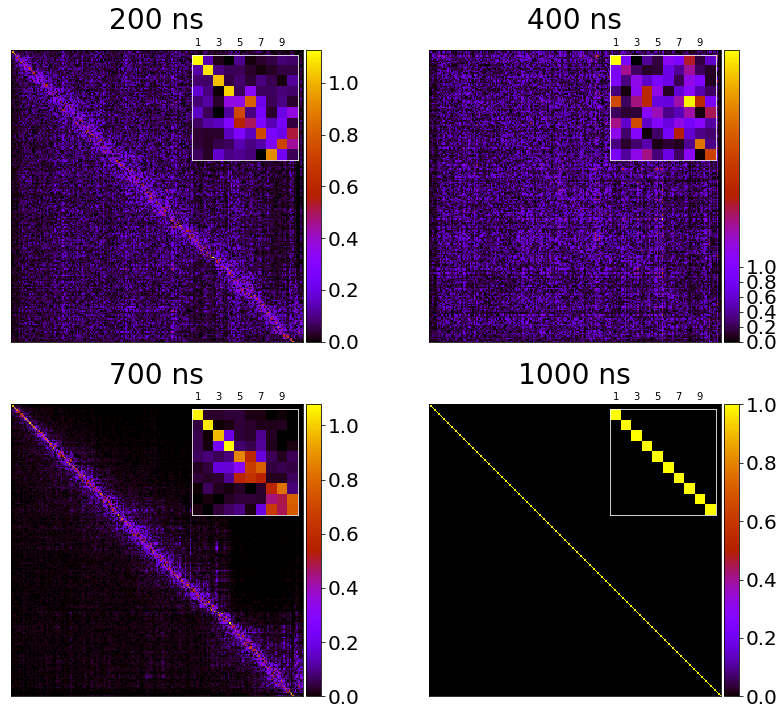

In [3]:
# Figure 2 -- Eigenvector convergence

Q = np.reshape(np.loadtxt('../com_HCmatrix'), (228, 228))

QT = np.load('../200ns/com_HCINVmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax0.set_title('200 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

QT = np.load('../400ns/com_HCINVmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax1.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax1.set_title('400 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

QT = np.load('../700ns/com_HCINVmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax2.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax2.set_title('700 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

QT = np.reshape(np.loadtxt('../com_HCINVmatrix'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax3.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax3.set_title('1000 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_converge_HA.pdf', dpi = 300)
plt.show()
plt.close()

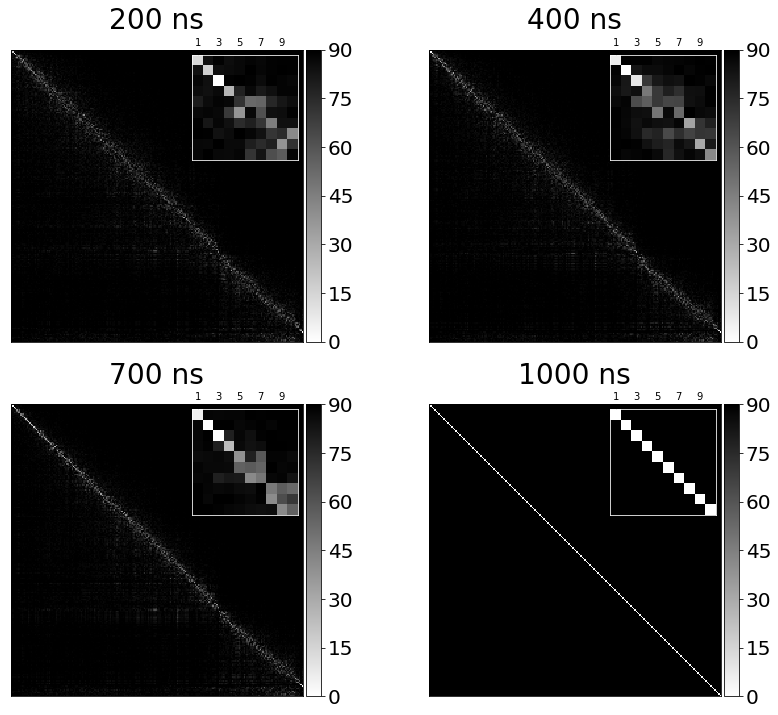

In [38]:
# Figure 2 -- Eigenvector convergence

QT = np.reshape(np.loadtxt('../com_HCINVmatrix'), (228, 228))

Q = np.load('../200ns/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        if abs(overlap[i, j]) >= 1: overlap[i,j] = 0.99999999999999999
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0, 15, 30, 45, 60, 75, 90]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(np.rad2deg(np.arccos(abs(overlap))), cmap = 'binary')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(np.rad2deg(np.arccos(abs(overlap)))[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
axins.set_yticks([])
ax0.set_title('200 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../400ns/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        if abs(overlap[i, j]) >= 1: overlap[i,j] = 0.99999999999999999
        
im=ax1.matshow(np.rad2deg(np.arccos(abs(overlap))),cmap = 'binary')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(np.rad2deg(np.arccos(abs(overlap)))[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
axins.set_yticks([])
ax1.set_title('400 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../700ns/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        if abs(overlap[i, j]) >= 1: overlap[i,j] = 0.99999999999999999
        
im=ax2.matshow(np.rad2deg(np.arccos(abs(overlap))),cmap = 'binary')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(np.rad2deg(np.arccos(abs(overlap)))[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
axins.set_yticks([])
ax2.set_title('700 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.reshape(np.load('../com_HCmatrix.npy'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        if abs(overlap[i, j]) >= 1: overlap[i,j] = 0.99999999999999999
        
im=ax3.matshow(np.rad2deg(np.arccos(abs(overlap))),cmap = 'binary')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(np.rad2deg(np.arccos(abs(overlap)))[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
axins.set_yticks([])
ax3.set_title('1000 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/cosine_converge_HA.pdf', dpi = 300)
plt.show()
plt.close()

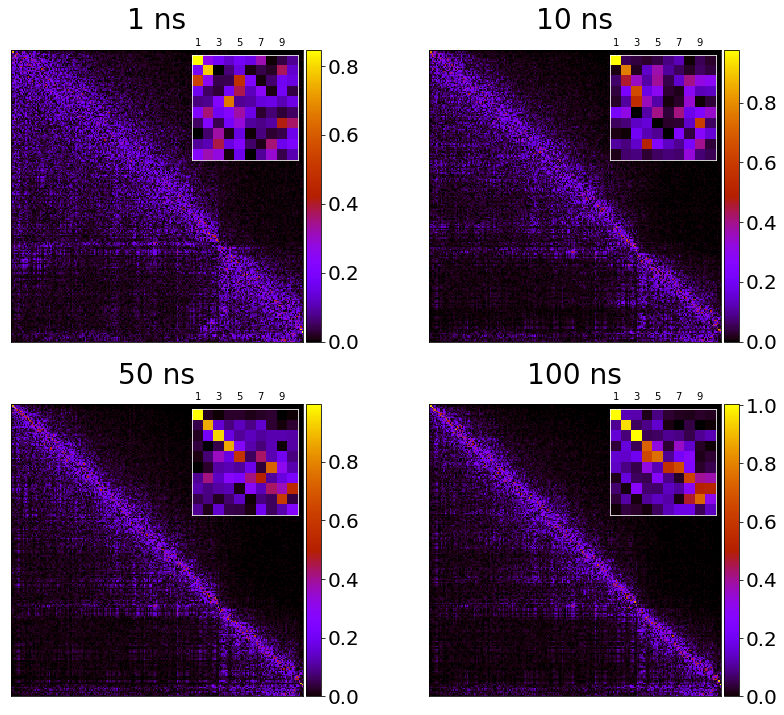

In [39]:
# Short

QT = np.reshape(np.loadtxt('../com_HCINVmatrix'), (228, 228))

Q = np.load('../1ns/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax0.set_title('1 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../10ns/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax1.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax1.set_title('10 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../50ns/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax2.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax2.set_title('50 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.reshape(np.loadtxt('../100ns/com_HCmatrix'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax3.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax3.set_title('100 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_converge_HA_short.pdf', dpi = 300)
plt.show()
plt.close()

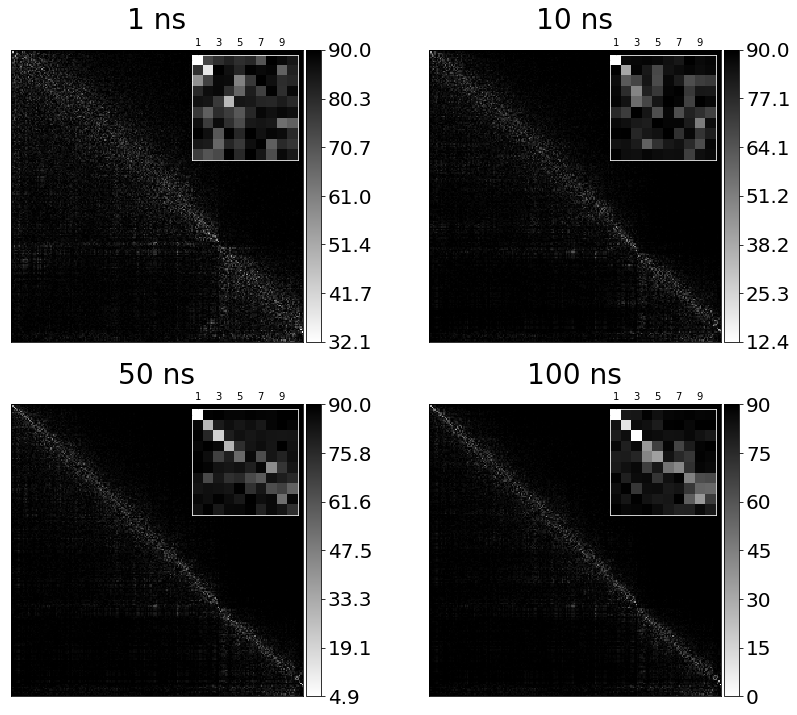

In [40]:
# Short

QT = np.reshape(np.loadtxt('../com_HCINVmatrix'), (228, 228))

Q = np.load('../1ns/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        if abs(overlap[i,j]) >= 1: overlap[i,j] = 1
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(cosine, cmap = 'binary')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax0.set_title('1 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
tics = list(np.round(np.linspace(cosine.min(), cosine.max(), 7), 1))
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../10ns/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        if abs(overlap[i,j]) >= 1: overlap[i,j] = 1
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
im = ax1.matshow(cosine, cmap = 'binary')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax1.set_title('10 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
tics = list(np.round(np.linspace(cosine.min(), cosine.max(), 7), 1))
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../50ns/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        if abs(overlap[i,j]) >= 1: overlap[i,j] = 1
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
im = ax2.matshow(cosine, cmap = 'binary')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax2.set_title('50 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
tics = list(np.round(np.linspace(cosine.min(), cosine.max(), 7), 1))
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.reshape(np.loadtxt('../100ns/com_HCmatrix'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        if abs(overlap[i,j]) >= 1: overlap[i,j] = 1
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
im=ax3.matshow(cosine,cmap = 'binary')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax3.set_title('100 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
tics = list(np.round(np.linspace(cosine.min(), cosine.max(), 7), 1))
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/cosine_converge_short_HA.pdf', dpi = 300)
plt.show()
plt.close()

In [23]:
#Local mode lengthscales

N = 76
lml_list = []

for i in times:
    print(i)
    if i != 1000:
        Q = np.load('../' + str(i) + 'ns/com_HCmatrix.npy')
        eigvals = abs(np.loadtxt('../'  +str(i) + 'ns/com_covar_eig'))
    else:
        Q = np.reshape(np.loadtxt('../com_HCmatrix'), (3*N, 3*N))
        eigvals = abs(np.loadtxt('../com_covar_eig'))
        
    Qx = Q[::3,:]
    Qy = Q[1::3,:]
    Qz = Q[2::3,:]
    
    lml = np.zeros((N, 3*N))
    
    for j in range(N):
        lml[j,:] = 10*np.sqrt(((Qx[j,:]**2 + Qy[j,:]**2 + Qz[j,:]**2))*eigvals[:])
        
    lml_list.append(lml)

NameError: name 'times' is not defined

In [ ]:
selected = np.array([50, 100, 400, 800, 1000])

for a in range(10):
    for n, i in enumerate(times):
        if np.any(selected == i):
            plt.plot(np.arange(1, N + 1), lml_list[n][:,a], lw = 2, c = colors[n], label = str(i) + ' ns')
    plt.xlabel('Sequence', fontsize = 16)
    plt.ylabel(r'LML, $\AA$', fontsize = 16)
    plt.xticks(size = 12)
    plt.yticks(size = 12)
    plt.title('Mode ' + str(a + 1), fontsize = 20)
    plt.legend()
    plt.savefig('figures/lml_' + str(a + 1) + '_change_time_HA.pdf', dpi = 300)
    plt.show()
    plt.close()

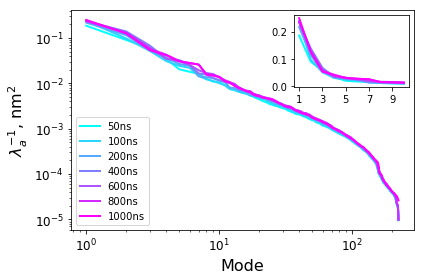

In [33]:
times = [50, 100, 200, 400, 600, 800, 1000]
colors = plt.cm.cool(np.linspace(0, 1, len(times)))

fig, ax0 = plt.subplots()
axins = inset_axes(ax0, width = 1.6, height = 1, loc = 'upper right')

for n, i in enumerate(times):
    if i == 1000:
        eigvals = np.loadtxt('../com_HC_eig')
    else:
        eigvals = np.loadtxt('../' + str(i) + 'ns/com_HC_eig')
                     
    ax0.plot(np.arange(1, 223), eigvals[:-6], lw = 2, c = colors[n], label = str(i) + 'ns')
    axins.plot(np.arange(1, 11), eigvals[:10], lw = 2, c = colors[n], label = str(i + 1))
ax0.set_xlabel('Mode', fontsize = 16)
ax0.set_ylabel(r'$\lambda_a^{-1}$, nm$^2$', fontsize = 16)
ax0.tick_params(labelsize = 12)
ax0.set_xscale('log')
ax0.set_yscale('log')
#ax0.set_yticks(size = 12)
axins.set_xticks([1, 3, 5, 7, 9])
ax0.legend(loc = 'lower left')
plt.tight_layout()
plt.savefig('figures/eigvals_converge_HA.pdf', dpi = 300)
plt.show()
plt.close()

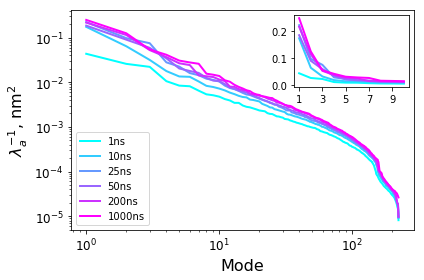

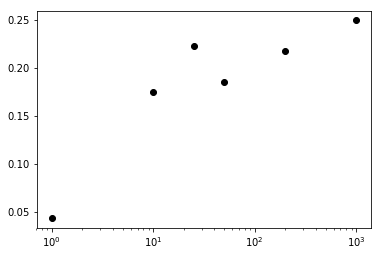

In [40]:
#Short

times = [1, 10, 25, 50, 200, 1000]
colors = plt.cm.cool(np.linspace(0, 1, len(times)))
fig, ax0 = plt.subplots()
axins = inset_axes(ax0, width = 1.6, height = 1, loc = 'upper right')
eigval0_list = []
for n, i in enumerate(times):
    if i == 1000:
        eigvals = np.loadtxt('../com_HC_eig')
    else:
        eigvals = np.loadtxt('../' + str(i) + 'ns/com_HC_eig')
    eigval0_list.append(eigvals[0])
                     
    ax0.plot(np.arange(1, 223), eigvals[:-6], lw = 2, c = colors[n], label = str(i) + 'ns')
    axins.plot(np.arange(1, 11), eigvals[:10], lw = 2, c = colors[n], label = str(i + 1))
ax0.set_xlabel('Mode', fontsize = 16)
ax0.set_ylabel(r'$\lambda_a^{-1}$, nm$^2$', fontsize = 16)
ax0.tick_params(labelsize = 12)
ax0.set_xscale('log')
ax0.set_yscale('log')
#ax0.set_yticks(size = 12)
axins.set_xticks([1, 3, 5, 7, 9])
ax0.legend(loc = 'lower left')
plt.tight_layout()
plt.savefig('figures/eigvals_converge_short_HA.pdf', dpi = 300)
plt.show()
plt.close()

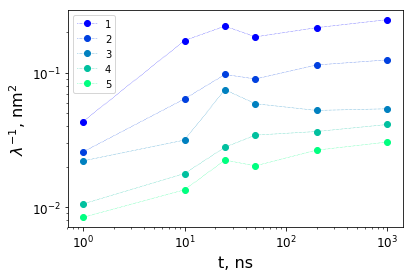

In [52]:
times = [1, 10, 25, 50, 200, 1000]
colors = plt.cm.winter(np.linspace(0, 1, 5))
for a in range(5):
    eigval0_list = []
    for n, i in enumerate(times):
        if i == 1000:
            eigvals = np.loadtxt('../com_HC_eig')
        else:
            eigvals = np.loadtxt('../' + str(i) + 'ns/com_HC_eig')
        eigval0_list.append(eigvals[a])

    plt.plot(times, eigval0_list, lw = 0.5, ls = ':', marker = 'o', c = colors[a], label = a + 1)
plt.xscale('log')
plt.yscale('log')
plt.xticks(size = 12)
plt.yticks(size = 12)
plt.xlabel('t, ns', fontsize = 16)
plt.ylabel(r'$\lambda^{-1}$, nm$^2$', fontsize = 16)
plt.legend()
plt.show()
plt.close()

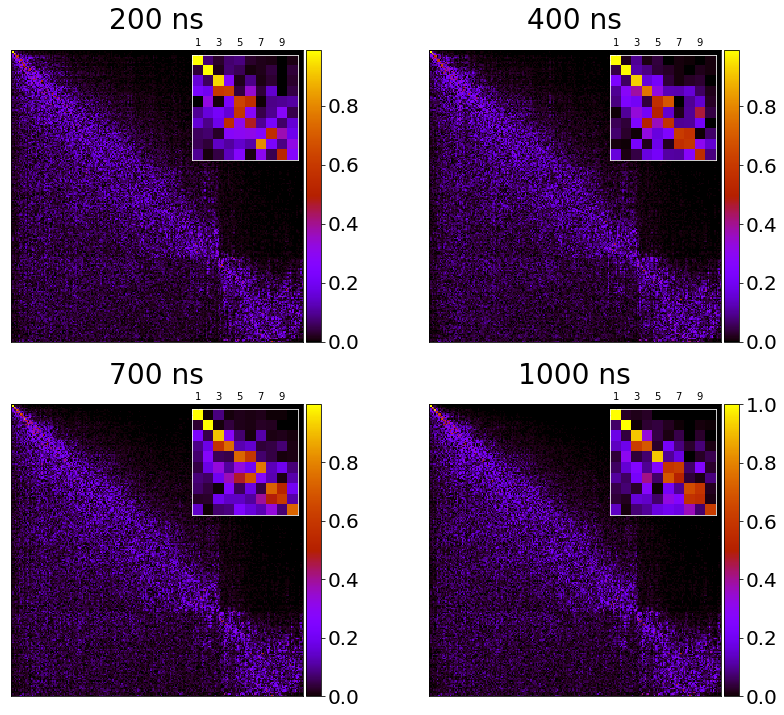

In [35]:
# Mixed overlap

Q = np.reshape(np.loadtxt('../com_HCmatrix'), (228, 228))

QT = np.load('../200ns/com_RTmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax0.set_title('200 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

QT = np.load('../400ns/com_RTmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax1.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax1.set_title('400 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

QT = np.load('../700ns/com_RTmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax2.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax2.set_title('700 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

QT = np.reshape(np.loadtxt('../com_RTmatrix'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax3.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax3.set_title('1000 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_converge_crossed.pdf', dpi = 300)
plt.show()
plt.close()

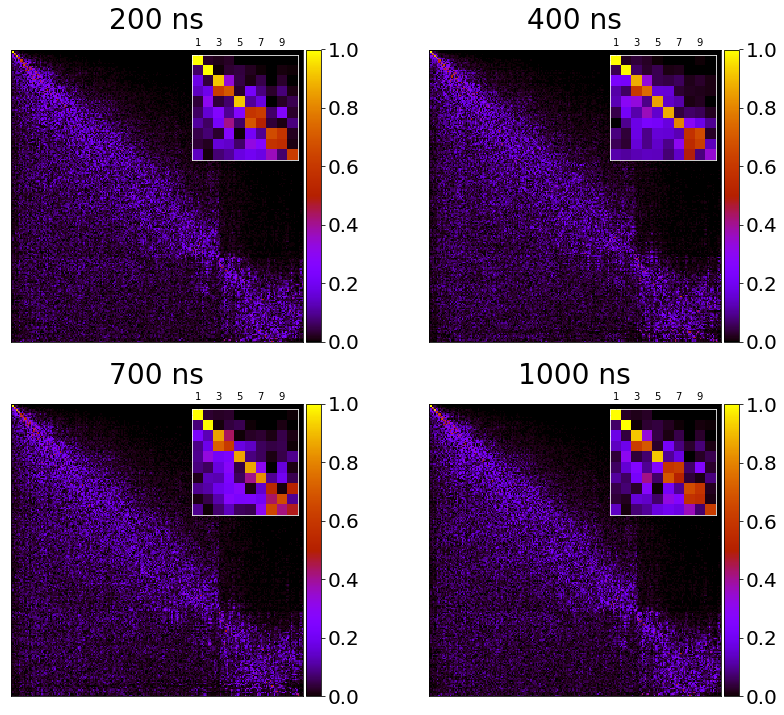

In [36]:
# Mixed overlap, same temporal statistics

Q = np.load('../200ns/com_HCmatrix.npy')
QT = np.load('../200ns/com_RTmatrix.npy')
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax0.set_title('200 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../400ns/com_HCmatrix.npy')
QT = np.load('../400ns/com_RTmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax1.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax1.set_title('400 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../700ns/com_HCmatrix.npy')
QT = np.load('../700ns/com_RTmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax2.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax2.set_title('700 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../com_HCmatrix.npy')
QT = np.load('../com_Rmatrix.npy').T
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax3.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax3.set_title('1000 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_converge_crossed_same_statistics.pdf', dpi = 300)
plt.show()
plt.close()

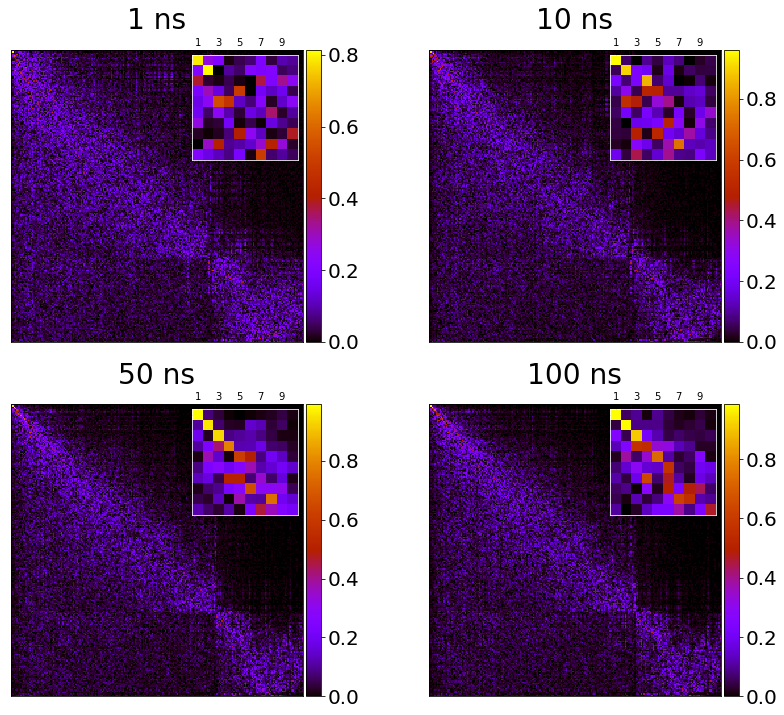

In [37]:
# Short

Q = np.reshape(np.loadtxt('../com_HCmatrix'), (228, 228))

QT = np.load('../1ns/com_RTmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax0.set_title('1 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

QT = np.load('../10ns/com_RTmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax1.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax1.set_title('10 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

QT = np.load('../50ns/com_RTmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax2.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax2.set_title('50 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

QT = np.reshape(np.loadtxt('../100ns/com_RTmatrix'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax3.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax3.set_title('100 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_converge_short_crossed.pdf', dpi = 300)
plt.show()
plt.close()

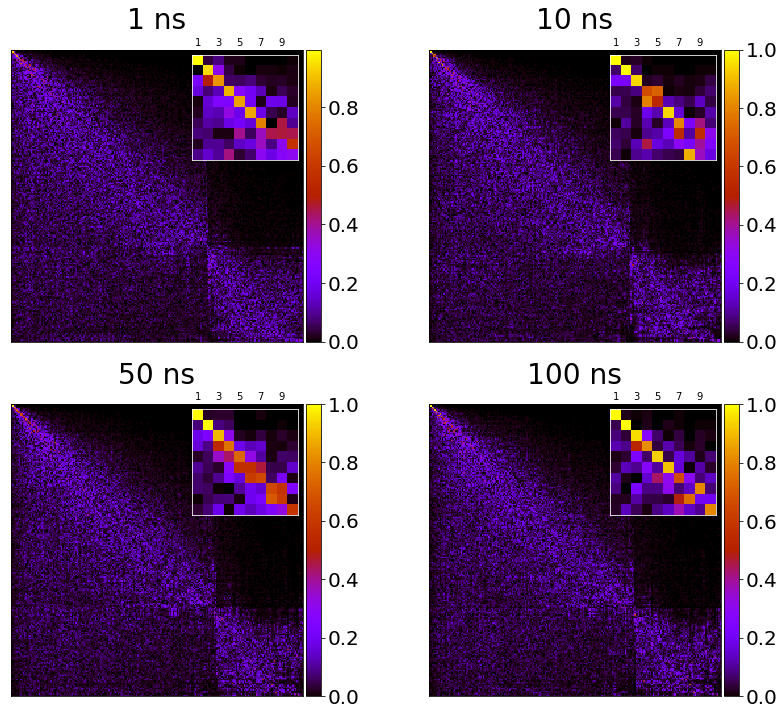

In [32]:
# Mixed overlap, same temporal statistics

Q = np.load('../1ns/com_HCmatrix.npy')
QT = np.load('../1ns/com_RTmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax0.set_title('1 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../10ns/com_HCmatrix.npy')
QT = np.load('../10ns/com_RTmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax1.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax1.set_title('10 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../50ns/com_HCmatrix.npy')
QT = np.load('../50ns/com_RTmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax2.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax2.set_title('50 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../100ns/com_HCmatrix.npy')
QT = np.load('../100ns/com_RTmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax3.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.spines['bottom'].set_color('white')
axins.spines['top'].set_color('white')
axins.spines['left'].set_color('white')
axins.spines['right'].set_color('white')
ax3.set_title('100 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_converge_crossed_short_same_statistics.pdf', dpi = 300)
plt.show()
plt.close()

In [31]:
#Chunks

nfrs = traj.shape[1]
traj_list = []
R_list = []
eigval_list = []
#If using the large-shared node, there is enough memory to perform this matrix multiplication,
#even for the 1 microsecond simulation.
for k in range(9,10):
    print(k)
    if k == 0:
        dtraj = np.copy(traj[:,0:int((nfrs / 10)*(k + 1))])
        avg_coor = traj[:,0:int((nfrs / 10)*(k + 1))].mean(1)
        for i in range(traj.shape[0]):
            dtraj[i,:] = traj[i,0:int((nfrs / 10)*(k + 1))] - avg_coor[i]
        covar = np.matmul(dtraj, (dtraj).T) / (dtraj).shape[1]
        eigvals, R = np.linalg.eigh(covar)
        R_sorted = R[:,np.argsort(1/abs(eigvals))]
        #R_list.append(R_sorted)
        #eigval_list.append(eigvals[np.argsort(1/abs(eigvals))])
        #traj_list.append(traj[:,0:int((nfrs / 10)*(k + 1))])
        np.save('../chunks/' + str(k + 1) + '/unformatted_traj.npy', traj[:,0:int((nfrs / 10)*(k + 1))])
    else:
        dtraj = np.copy(traj[:,int((nfrs / 10)*k) - 1:int((nfrs / 10)*(k + 1)) - 1])
        avg_coor = traj[:,int((nfrs / 10)*k):int((nfrs / 10)*(k + 1))].mean(1)
        for i in range(traj.shape[0]):
            dtraj[i,:] = traj[i,int((nfrs / 10)*k) - 1:int((nfrs / 10)*(k + 1)) - 1] - avg_coor[i]
        covar = np.matmul(dtraj, (dtraj).T) / (dtraj).shape[1]
        eigvals, R = np.linalg.eigh(covar)
        R_sorted = R[:,np.argsort(1/abs(eigvals))]
        #R_list.append(R_sorted)
        #eigval_list.append(eigvals[np.argsort(1/abs(eigvals))])
        #traj_list.append(traj[:,int((nfrs / 10)*k):int((nfrs / 10 - 1)*(k + 1))])
        np.save('../chunks/' + str(k + 1) + '/unformatted_traj.npy', traj[:,int((nfrs / 10)*k) - 1:int((nfrs / 10)*(k + 1)) - 1])
        print(traj[:,int((nfrs / 10)*k) - 1:int((nfrs / 10)*(k + 1)) - 1].shape)
        
    np.save('../chunks/' + str(k + 1) + '/com_covariance_matrix.npy', covar)
    np.savetxt('../chunks/' + str(k + 1) + '/com_covariance_matrix.dat', covar.ravel())
    np.save('../chunks/' + str(k + 1) + '/com_Rmatrix.npy', R_sorted)
    np.save('../chunks/' + str(k + 1) + '/com_RTmatrix.npy', R_sorted.T)
    np.savetxt('../chunks/' + str(k + 1) + '/com_covar_eig', eigvals[np.argsort(1/abs(eigvals))])

9
(228, 500000)


In [24]:
for i in range(10):
    print(i)
    itraj = np.load('../chunks/' + str(i + 1) + '/unformatted_traj.npy')
    hydrodynamics.Rij(itraj, path = '../chunks/' + str(int(i + 1)) + '/')
    hydrodynamics.fric_calc(itraj, '../top.pdb', T = 300, viscosity=0, path_to_resarea = '../chunks/' + str(int(i + 1)) + '/')
    LE4PD_XYZ.eigendecomp(76, path='../chunks/' + str(i + 1) + '/')

0
76 500000
76 500000
fratio:  0.21090913838460512
Temperature (K):  300
Internal viscosity factor:  2.71828
No viscosity given. Using the NIST formula, which is only valid for physiological conditions,

i.e. between about 273 and 310 K.
Viscosity (Pa s):  0.0008518364365438791
fd20 0.0
1
76 500000
76 500000
fratio:  0.21100590636833946
Temperature (K):  300
Internal viscosity factor:  2.71828
No viscosity given. Using the NIST formula, which is only valid for physiological conditions,

i.e. between about 273 and 310 K.
Viscosity (Pa s):  0.0008518364365438791
fd20 0.0
Q is a singular matrix
2
76 500000
76 500000
fratio:  0.20993340006595504
Temperature (K):  300
Internal viscosity factor:  2.71828
No viscosity given. Using the NIST formula, which is only valid for physiological conditions,

i.e. between about 273 and 310 K.
Viscosity (Pa s):  0.0008518364365438791
fd20 0.0
3
76 500000
76 500000
fratio:  0.20821384076417168
Temperature (K):  300
Internal viscosity factor:  2.71828
No v

/home/ebeyerle/bin/anaconda3/envs/pyemma_tutorials/lib/python3.7/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


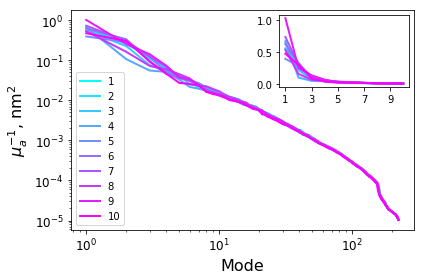

In [30]:
times = list(range(10))
colors = plt.cm.cool(np.linspace(0, 1, len(times)))

fig, ax0 = plt.subplots()
axins = inset_axes(ax0, width = 1.8, height = 1, loc = 'upper right')
min_list = []
max_list = []

for n, i in enumerate(range(10)):
    if i == 1000:
        eigvals = np.loadtxt('../chunks/com_covar_eig')
    else:
        eigvals = np.loadtxt('../chunks/' + str(i + 1) + '/com_covar_eig')
         
    #eigvals_list.append(eigvals[0].min())
    ax0.plot(np.arange(1, 223), eigvals[:-6], lw = 2, c = colors[n], label = str(i + 1))
    axins.plot(np.arange(1, 11), eigvals[:10], lw = 2, c = colors[n], label = str(i + 1))
ax0.set_xlabel('Mode', fontsize = 16)
ax0.set_ylabel(r'$\mu_a^{-1}$, nm$^2$', fontsize = 16)
ax0.tick_params(labelsize = 12)
ax0.set_xscale('log')
ax0.set_yscale('log')
#ax0.set_yticks(size = 12)
axins.set_xticks([1, 3, 5, 7, 9])
ax0.legend()
plt.tight_layout()
plt.savefig('figures/eigvals_converge_chunks.pdf', dpi = 300)
plt.show()
plt.close()

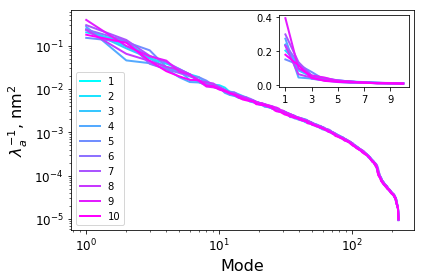

In [31]:
times = list(range(10))
colors = plt.cm.cool(np.linspace(0, 1, len(times)))

fig, ax0 = plt.subplots()
axins = inset_axes(ax0, width = 1.8, height = 1, loc = 'upper right')
min_list = []
max_list = []

for n, i in enumerate(range(10)):
    if i == 1000:
        eigvals = np.loadtxt('../chunks/com_HC_eig')
    else:
        eigvals = np.loadtxt('../chunks/' + str(i + 1) + '/com_HC_eig')
         
    #eigvals_list.append(eigvals[0].min())
    ax0.plot(np.arange(1, 223), eigvals[:-6], lw = 2, c = colors[n], label = str(i + 1))
    axins.plot(np.arange(1, 11), eigvals[:10], lw = 2, c = colors[n], label = str(i + 1))
ax0.set_xlabel('Mode', fontsize = 16)
ax0.set_ylabel(r'$\lambda_a^{-1}$, nm$^2$', fontsize = 16)
ax0.tick_params(labelsize = 12)
ax0.set_xscale('log')
ax0.set_yscale('log')
#ax0.set_yticks(size = 12)
axins.set_xticks([1, 3, 5, 7, 9])
ax0.legend()
plt.tight_layout()
plt.savefig('figures/eigvals_converge_chunks_HA.pdf', dpi = 300)
plt.show()
plt.close()

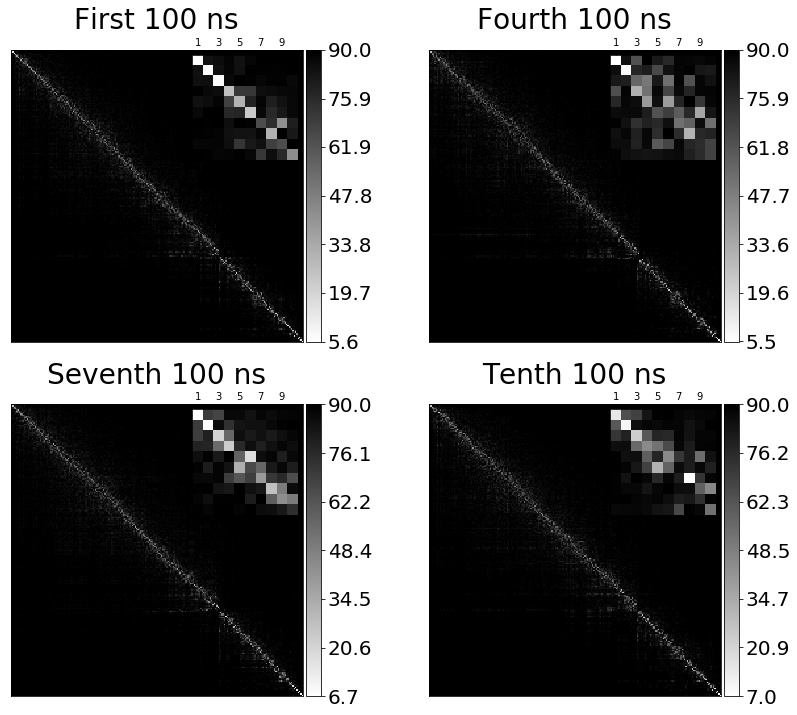

In [32]:
QT = np.reshape(np.loadtxt('../com_Rmatrix'), (228, 228)).T

Q = np.load('../chunks/1/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(cosine, cmap = 'binary')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax0.set_title('First 100 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
tics = list(np.round(np.linspace(cosine.min(), cosine.max(), 7), 1))
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../chunks/4/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
im=ax1.matshow(cosine,cmap = 'binary')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax1.set_title('Fourth 100 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
tics = list(np.round(np.linspace(cosine.min(), cosine.max(), 7), 1))
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../chunks/7/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
im=ax2.matshow(cosine,cmap = 'binary')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax2.set_title('Seventh 100 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
tics = list(np.round(np.linspace(cosine.min(), cosine.max(), 7), 1))
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.reshape(np.load('../chunks/10/com_Rmatrix.npy'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
im=ax3.matshow(cosine,cmap = 'binary')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax3.set_title('Tenth 100 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
tics = list(np.round(np.linspace(cosine.min(), cosine.max(), 7), 1))
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/cosine_converge_chunks_raster.pdf', dpi = 300)
plt.show()
plt.close()

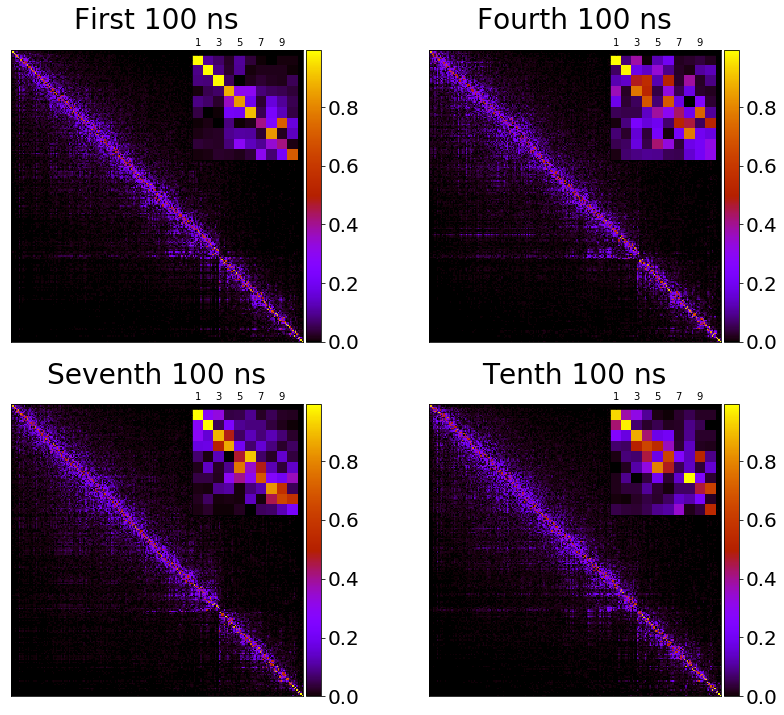

In [38]:
QT = np.reshape(np.loadtxt('../com_Rmatrix'), (228, 228)).T

Q = np.load('../chunks/1/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax0.set_title('First 100 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../chunks/4/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax1.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax1.set_title('Fourth 100 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../chunks/7/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax2.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax2.set_title('Seventh 100 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.reshape(np.load('../chunks/10/com_Rmatrix.npy'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax3.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax3.set_title('Tenth 100 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_converge_chunks_raster.pdf', dpi = 300)
plt.show()
plt.close()

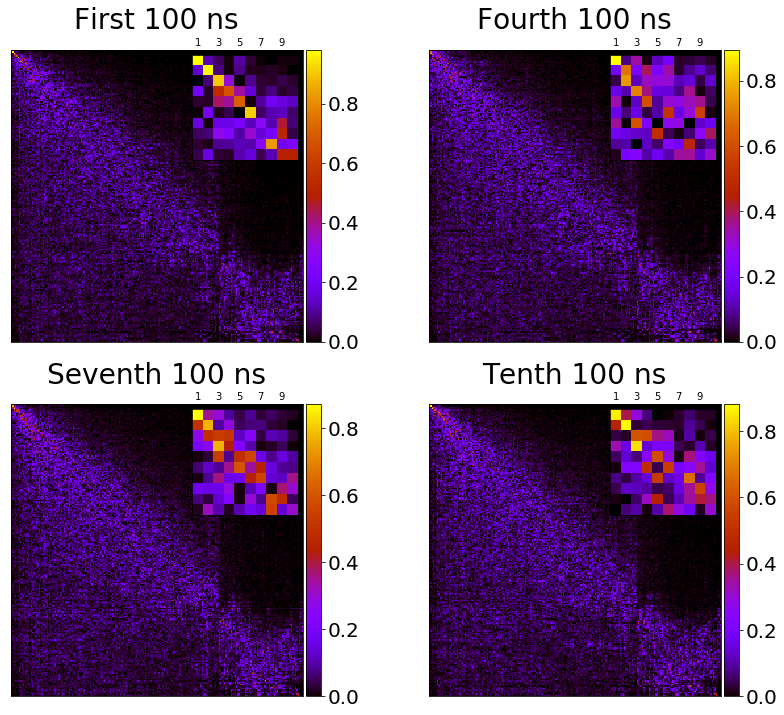

In [97]:
QT = np.reshape(np.loadtxt('../com_Rmatrix'), (228, 228)).T

Q = np.load('../chunks/1/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax0.set_title('First 100 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../chunks/4/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax1.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax1.set_title('Fourth 100 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../chunks/7/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax2.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax2.set_title('Seventh 100 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.reshape(np.load('../chunks/10/com_HCmatrix.npy'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax3.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax3.set_title('Tenth 100 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_converge_chunks_raster_crossed.pdf', dpi = 300)
plt.show()
plt.close()

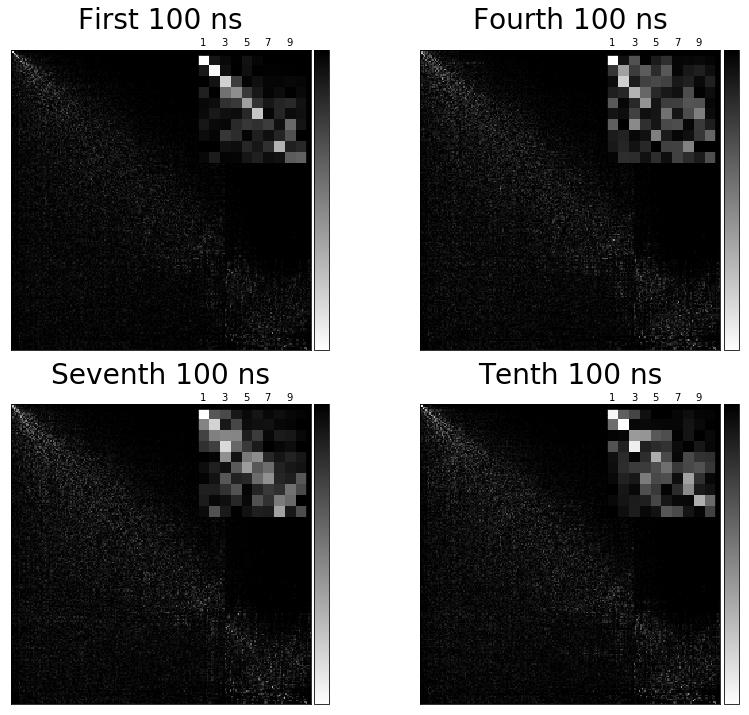

In [29]:
QT = np.reshape(np.loadtxt('../com_Rmatrix'), (228, 228)).T

Q = np.load('../chunks/1/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(cosine, cmap = 'binary')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax0.set_title('First 100 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../chunks/4/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
im=ax1.matshow(cosine,cmap = 'binary')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax1.set_title('Fourth 100 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../chunks/7/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
im=ax2.matshow(cosine,cmap = 'binary')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax2.set_title('Seventh 100 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.reshape(np.load('../chunks/10/com_HCmatrix.npy'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
cosine = np.rad2deg(np.arccos(abs(overlap)))
        
im=ax3.matshow(cosine,cmap = 'binary')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(cosine[:10,:10], cmap = 'binary')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax3.set_title('Tenth 100 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/cosine_converge_chunks_raster_crossed.pdf', dpi = 300)
plt.show()
plt.close()

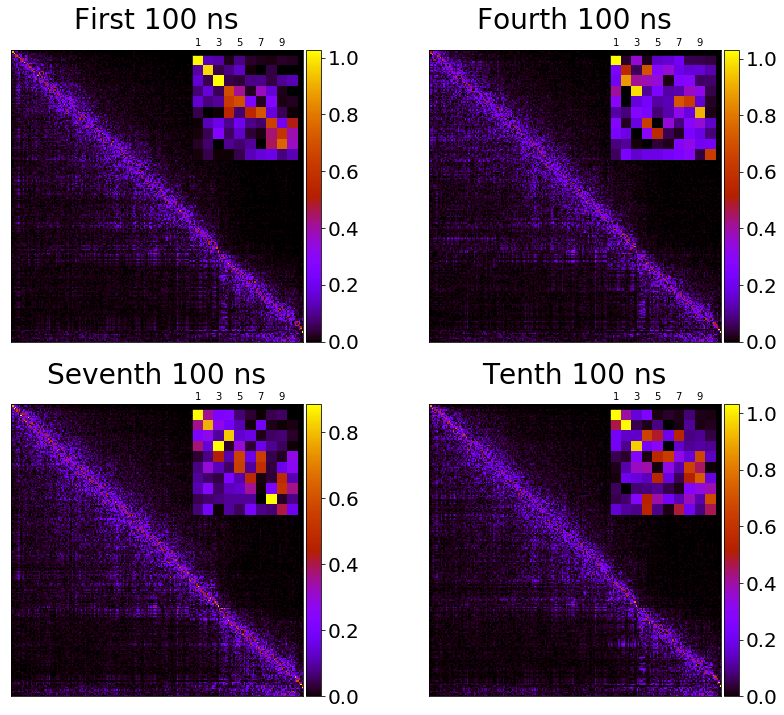

In [98]:
QT = np.reshape(np.loadtxt('../com_HCINVmatrix'), (228, 228))

Q = np.load('../chunks/1/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax0.set_title('First 100 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../chunks/4/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax1.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax1.set_title('Fourth 100 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../chunks/7/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax2.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax2.set_title('Seventh 100 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.reshape(np.load('../chunks/10/com_HCmatrix.npy'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax3.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax3.set_title('Tenth 100 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_converge_chunks_raster_HA.pdf', dpi = 300)
plt.show()
plt.close()

In [102]:
QT = np.reshape(np.loadtxt('../com_RTmatrix'), (228, 228))

Q = np.load('../chunks/1/com_Rmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])

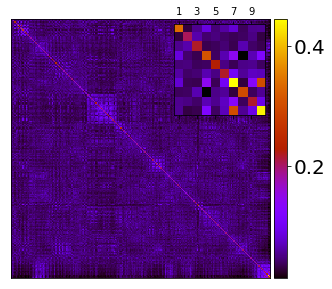

In [116]:
overlap = np.zeros_like(Q)
for i in range(10):
    Q = np.load('../chunks/' + str(i + 1) + '/com_Rmatrix.npy')
    for j in range(10):
        QT = np.load('../chunks/' + str(j + 1) + '/com_RTmatrix.npy')
        overlap += abs(np.matmul(Q, QT))
overlap = overlap / 100

from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ax0 = plt.subplots()
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.set_yticks([])
ax0.set_title('',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_raster_100ns.pdf', dpi = 300)
plt.show()
plt.close()

0
1
2
3
5
7
9


/home/ebeyerle/bin/anaconda3/envs/pyemma_tutorials/lib/python3.7/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


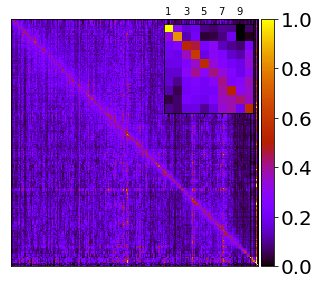

In [163]:
overlap = np.zeros((Q.shape[0] - 6, Q.shape[1] - 6))
dummy_list = []
good_list = [0, 1, 2, 3, 5, 7, 9]
for i in good_list:
    print(i)
    Q = np.load('../chunks/' + str(i + 1) + '/com_HCmatrix.npy')
    for j in good_list:
        QT = np.load('../chunks/' + str(j + 1) + '/com_HCINVmatrix.npy')
        dummy = np.zeros((Q.shape[0] - 6, Q.shape[1] - 6))
        for n in range(Q.shape[0] - 6):
            for m in range(Q.shape[1] - 6):
                dummy[n,m] = abs(np.dot(Q[:,n], QT[m,:]))
        #dummy_list.append(dummy)
        overlap += dummy
overlap = overlap / (len(good_list)**2)

#KLUDGE
for i in range(overlap.shape[0]):
    for j in range(overlap.shape[1]):
        if overlap[i,j] > 1.0: overlap[i,j] = 1
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ax0 = plt.subplots()
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.set_yticks([])
ax0.set_title('',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_raster_100ns_HA.pdf', dpi = 300)
plt.show()
plt.close()

0
1
2
3
5
7
9


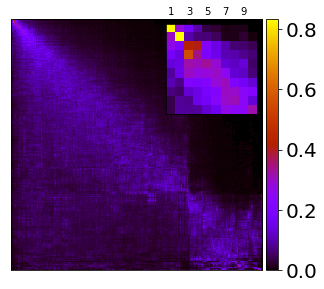

In [165]:
overlap = np.zeros((Q.shape[0] - 6, Q.shape[1] - 6))
dummy_list = []
good_list = [0, 1, 2, 3, 5, 7, 9]
for i in good_list:
    print(i)
    Q = np.load('../chunks/' + str(i + 1) + '/com_HCmatrix.npy')
    for j in good_list:
        QT = np.load('../chunks/' + str(j + 1) + '/com_RTmatrix.npy')
        dummy = np.zeros((Q.shape[0] - 6, Q.shape[1] - 6))
        for n in range(Q.shape[0] - 6):
            for m in range(Q.shape[1] - 6):
                dummy[n,m] = abs(np.dot(Q[:,n], QT[m,:]))
        #dummy_list.append(dummy)
        overlap += dummy
overlap = overlap / (len(good_list)**2)

#KLUDGE
for i in range(overlap.shape[0]):
    for j in range(overlap.shape[1]):
        if overlap[i,j] > 1.0: overlap[i,j] = 1
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ax0 = plt.subplots()
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
axins.set_yticks([])
ax0.set_title('',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_raster_100ns_crossed.pdf', dpi = 300)
plt.show()
plt.close()

In [ ]:
QT = np.reshape(np.loadtxt('../com_HCINVmatrix'), (228, 228))

Q = np.load('../chunks/1/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
from mpl_toolkits.axes_grid1 import make_axes_locatable
tics = [0.0,0.2,0.4,0.6,0.8,1.0]
nbins = 100
fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2, 2, figsize=(12, 10),sharex=True,sharey=True)
im = ax0.matshow(abs(overlap), cmap = 'gnuplot')
axins = zoomed_inset_axes(ax0, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax0.set_title('First 100 ns',fontsize=28)
ax0.set_xticks([])
ax0.set_yticks([])
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../chunks/4/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax1.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax1, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax1.set_title('Fourth 100 ns',fontsize=28)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.load('../chunks/7/com_HCmatrix.npy')
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax2.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax2, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax2.set_title('Seventh 100 ns',fontsize=28)
ax2.set_xticks([])
ax2.set_yticks([])
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

Q = np.reshape(np.load('../chunks/10/com_HCmatrix.npy'), (228, 228))
overlap = np.zeros((222, 222))
for i in range(Q.shape[0] - 6):
    for j in range(Q.shape[1] - 6):
        overlap[i,j] = np.dot(Q[:,i], QT[j,:])
        
im=ax3.matshow(abs(overlap),cmap = 'gnuplot')
axins = zoomed_inset_axes(ax3, zoom = 8, loc = 'upper right')
axins.matshow(abs(overlap)[:10,:10], cmap = 'gnuplot')
axins.set_xticks([0, 2, 4, 6, 8])
axins.set_xticklabels([1, 3, 5, 7, 9])
ax3.set_title('Tenth 100 ns',fontsize=28)
ax3.set_xticks([])
ax3.set_yticks([])
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax,ticks=tics)
cbar.ax.tick_params(labelsize=20) 

plt.tight_layout()
#plt.savefig('eigvec_converge.eps',dpi=1000)
plt.savefig('figures/eigvecs_converge_chunks_raster_HA.pdf', dpi = 300)
plt.show()
plt.close()

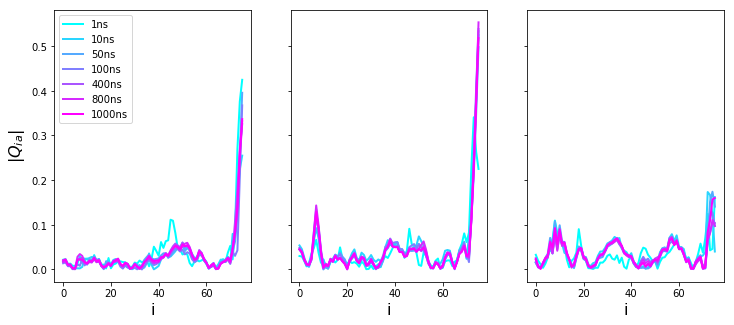

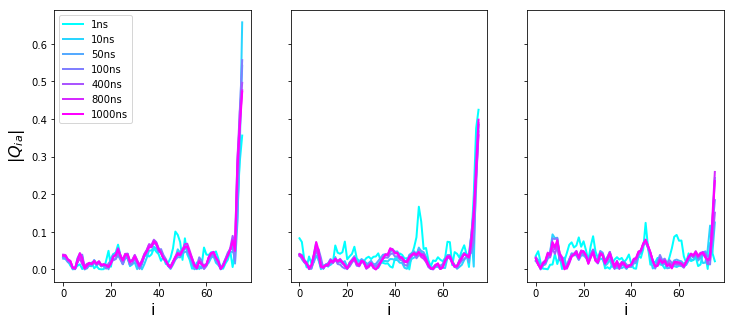

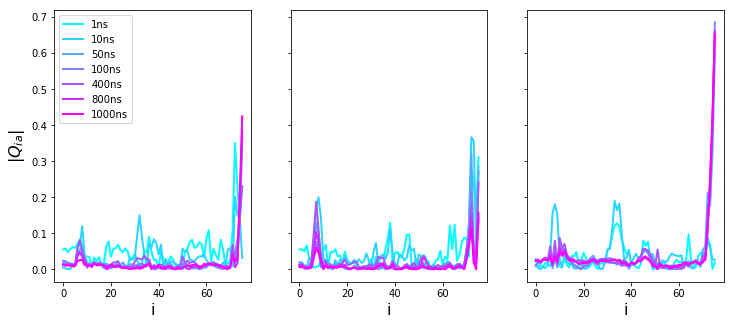

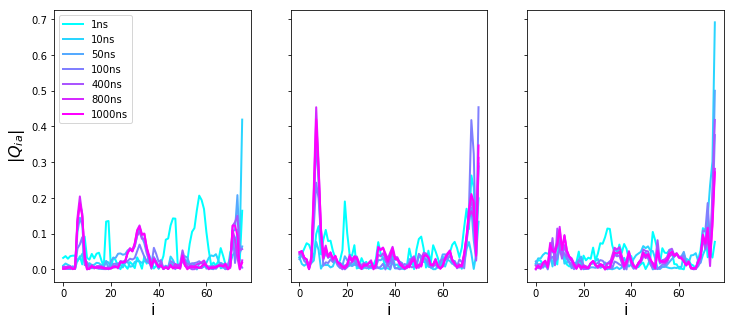

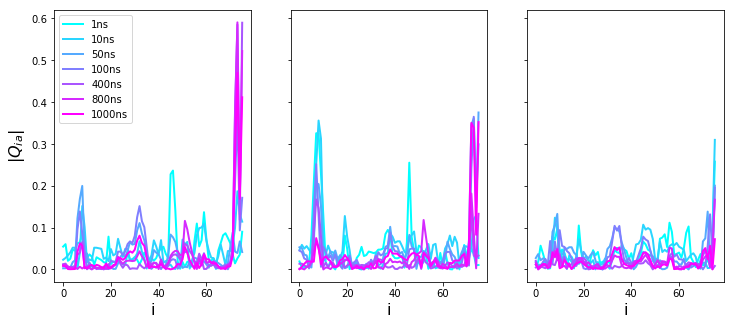

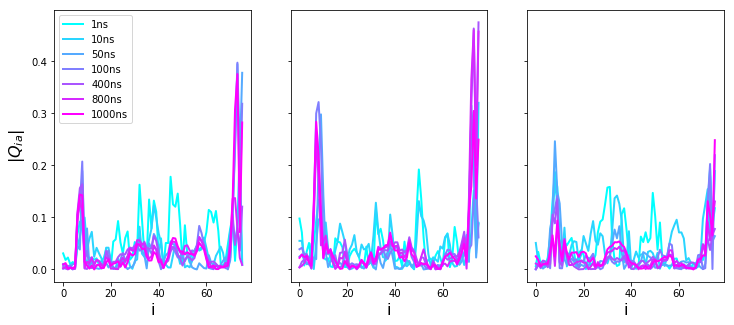

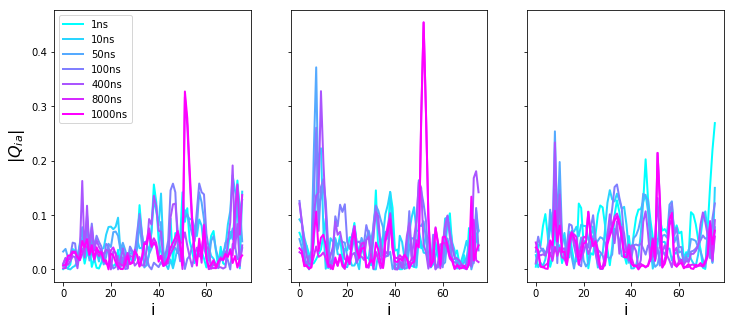

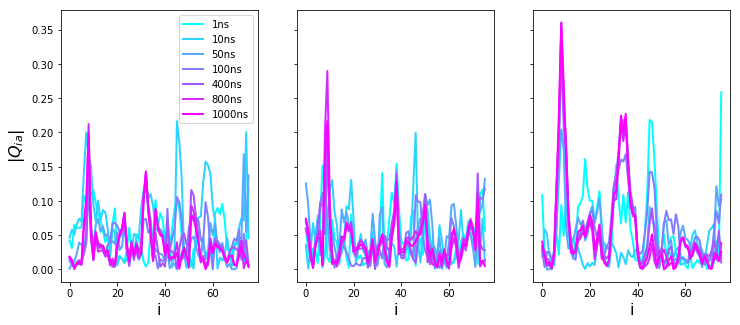

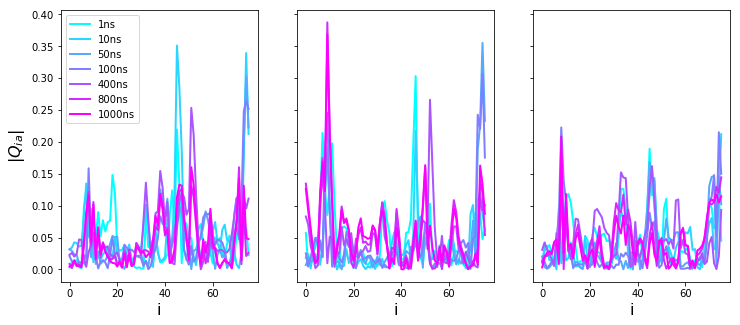

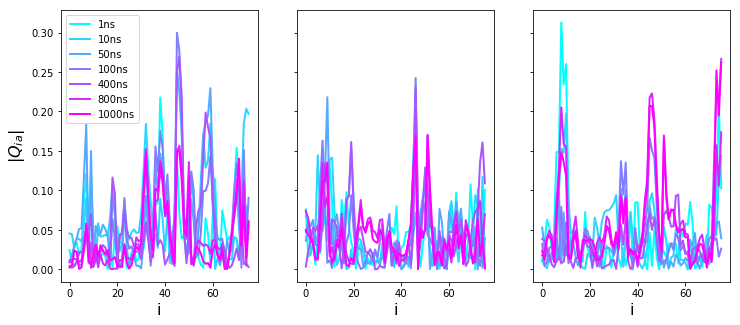

In [176]:
#Compare eigenvector components directly

for a in range(10):
    fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize = (12, 5), sharey = True)
    times = [1, 10, 50, 100, 400, 800, 1000]
    colors = plt.cm.cool(np.linspace(0, 1, len(times)))
    for n, i in enumerate(times):
        if i == 1000:
            Q = np.reshape(np.loadtxt('../com_Rmatrix'), (228, 228))
        else:
            Q = np.load('../' + str(i) + 'ns/com_Rmatrix.npy')
        ax0.plot(abs(Q[::3,a]), lw = 2, c = colors[n], label = str(i) + 'ns')
        ax1.plot(abs(Q[1::3,a]), lw = 2, c = colors[n])
        ax2.plot(abs(Q[2::3,a]), lw = 2, c = colors[n])
    ax0.set_ylabel(r'$\vert Q_{ia} \vert$', fontsize = 16)
    ax0.set_xlabel(r'$i$', fontsize = 16)
    ax1.set_xlabel(r'$i$', fontsize = 16)
    ax2.set_xlabel(r'$i$', fontsize = 16)
    ax0.legend()
    plt.show()
    plt.close()

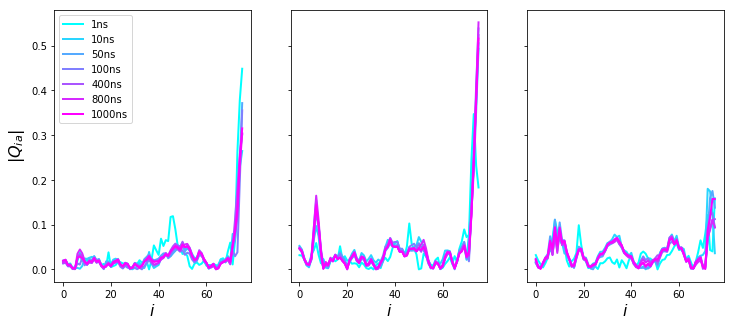

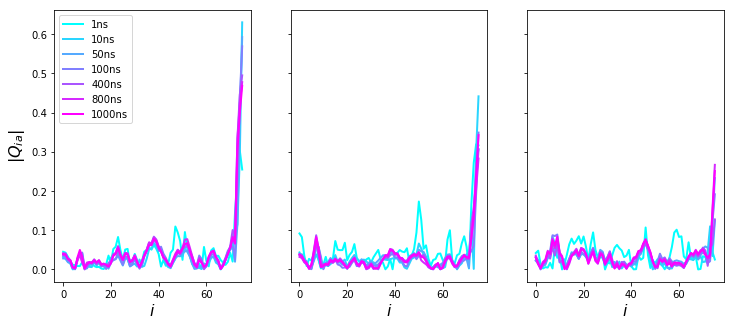

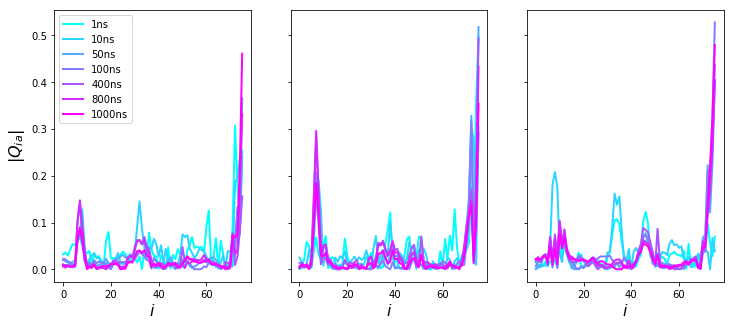

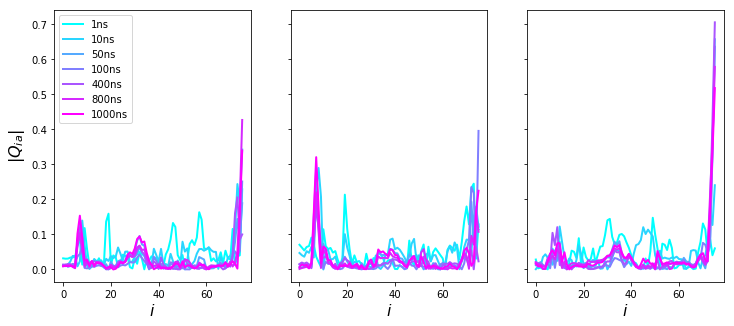

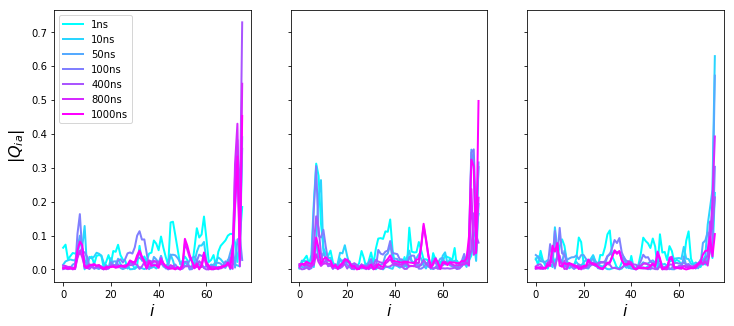

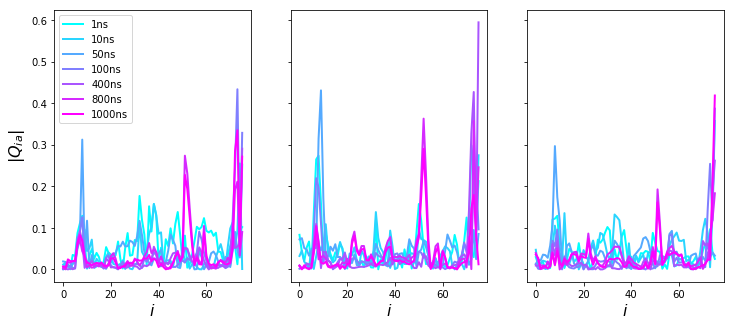

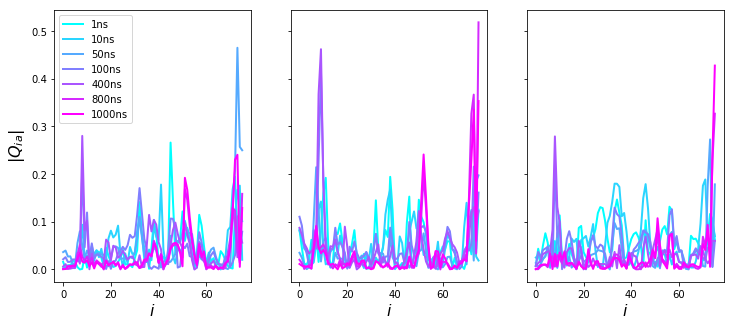

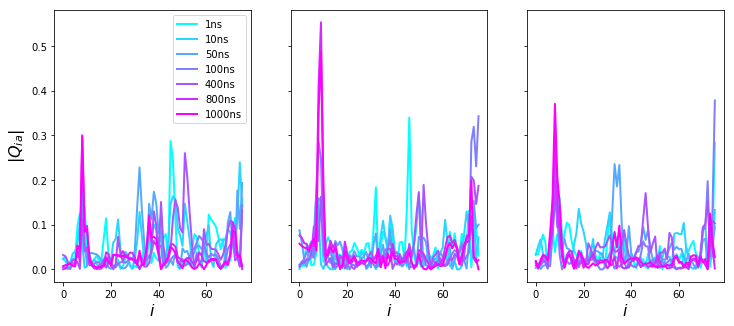

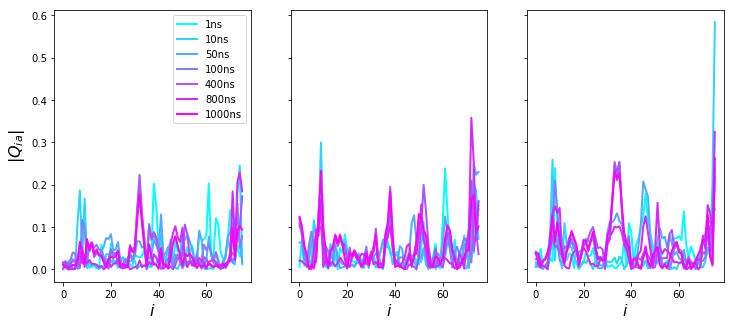

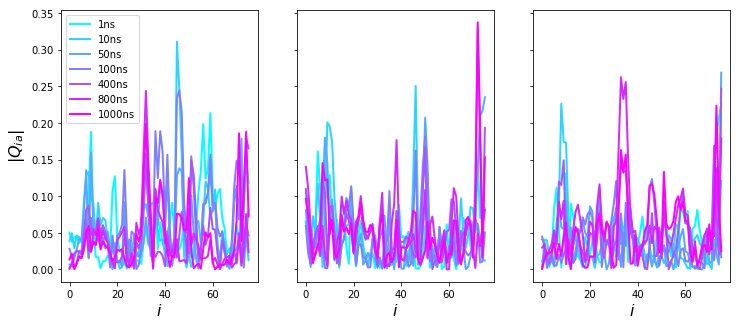

In [177]:
#Compare eigenvector components directly

for a in range(10):
    fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize = (12, 5), sharey = True)
    times = [1, 10, 50, 100, 400, 800, 1000]
    colors = plt.cm.cool(np.linspace(0, 1, len(times)))
    for n, i in enumerate(times):
        if i == 1000:
            Q = np.reshape(np.loadtxt('../com_HCmatrix'), (228, 228))
        else:
            Q = np.load('../' + str(i) + 'ns/com_HCmatrix.npy')
        ax0.plot(abs(Q[::3,a]), lw = 2, c = colors[n], label = str(i) + 'ns')
        ax1.plot(abs(Q[1::3,a]), lw = 2, c = colors[n])
        ax2.plot(abs(Q[2::3,a]), lw = 2, c = colors[n])
    ax0.set_ylabel(r'$\vert Q_{ia} \vert$', fontsize = 16)
    ax0.set_xlabel(r'$i$', fontsize = 16)
    ax1.set_xlabel(r'$i$', fontsize = 16)
    ax2.set_xlabel(r'$i$', fontsize = 16)
    ax0.legend()
    plt.show()
    plt.close()

In [192]:
np.save('../com_HCINVmatrix.npy', np.reshape(np.loadtxt('../com_HCINVmatrix'), (228, 228)))

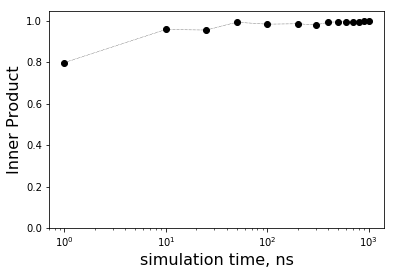

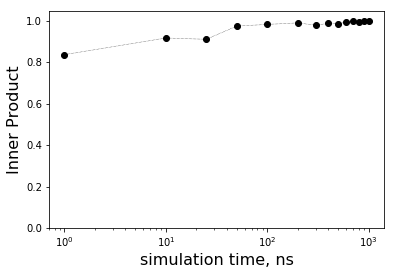

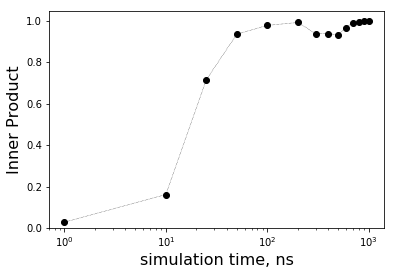

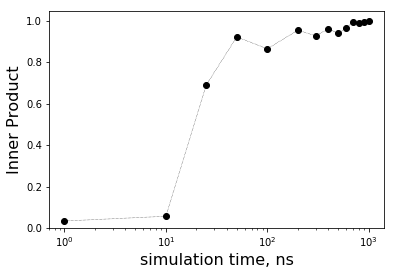

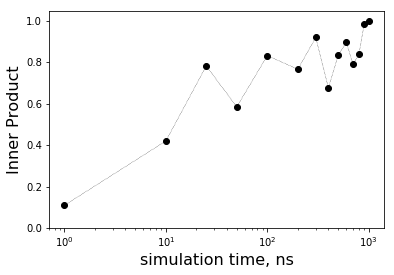

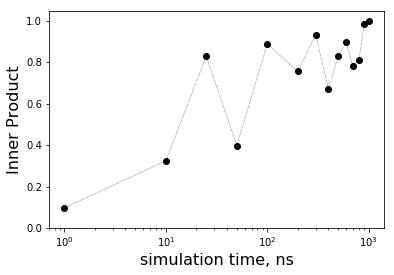

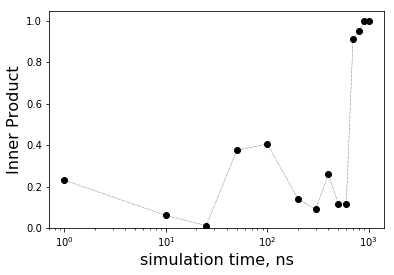

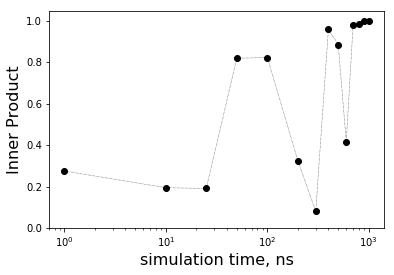

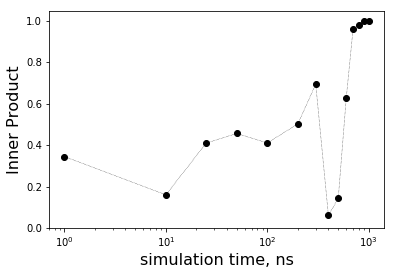

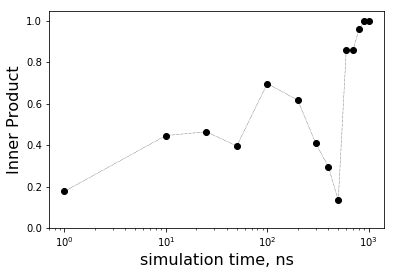

In [208]:
times = [1, 10, 25, 50] + list(range(100, 1100, 100))

Q2 = np.load('../com_Rmatrix.npy')
for a in range(10):
    dp_list = np.zeros(len(times))
    for n, i in enumerate(times):
        if i == 1000:
            Q1 = np.load('../com_Rmatrix.npy')
        else:
            Q1 = np.load('../' + str(i) + 'ns/com_Rmatrix.npy')

        dp_list[n] = abs(np.dot(Q1[:,a], Q2[:,a]))
    plt.plot(times, dp_list, lw = 0.5, ls = ":", marker = 'o', c= 'k')
    plt.xscale('log')
    plt.xlabel('simulation time, ns', fontsize = 16)
    plt.ylabel('Inner Product', fontsize = 16)
    plt.ylim((0, 1.05))
    plt.show()
    plt.close()

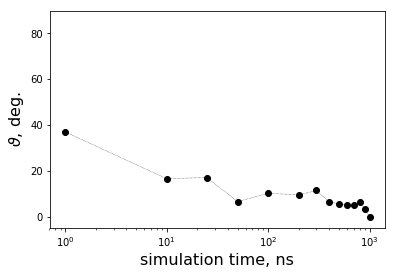

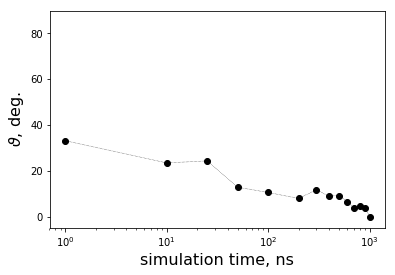

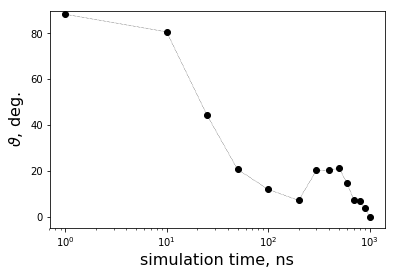

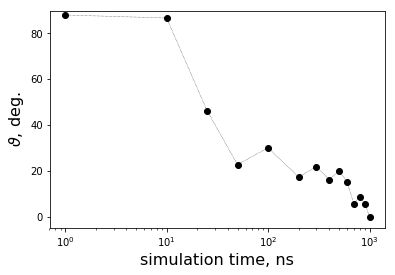

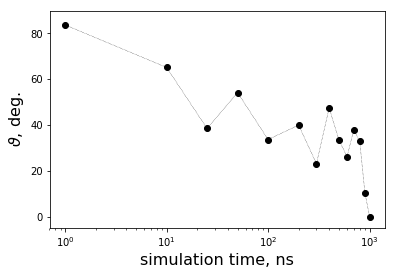

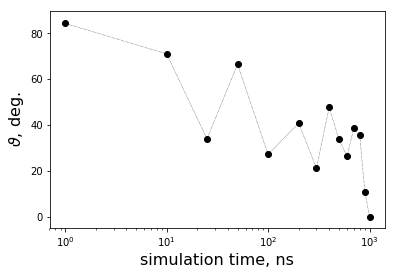

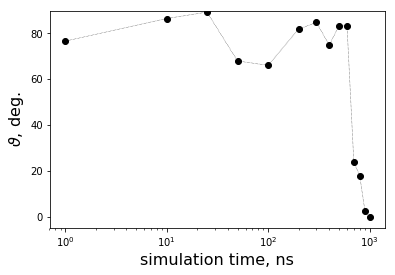

/home/ebeyerle/bin/anaconda3/envs/pyemma_tutorials/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in arccos
  if sys.path[0] == '':


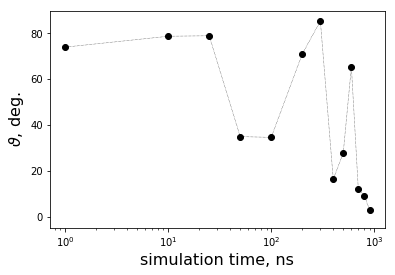

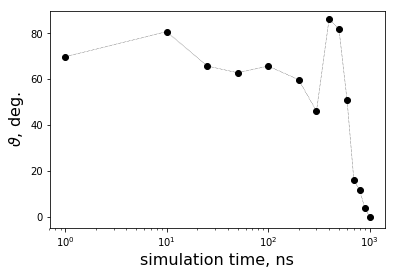

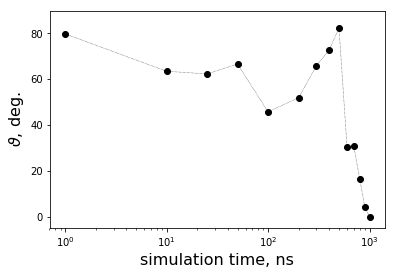

In [226]:
times = [1, 10, 25, 50] + list(range(100, 1100, 100))

Q2 = np.load('../com_Rmatrix.npy')
for a in range(10):
    dp_list = np.zeros(len(times))
    for n, i in enumerate(times):
        if i == 1000:
            Q1 = np.load('../com_Rmatrix.npy')
        else:
            Q1 = np.load('../' + str(i) + 'ns/com_Rmatrix.npy')

        dp_list[n] = np.rad2deg(np.arccos(abs(np.dot(Q1[:,a], Q2[:,a]))))
    plt.plot(times, dp_list, lw = 0.5, ls = ":", marker = 'o', c= 'k')
    plt.xscale('log')
    plt.xlabel('simulation time, ns', fontsize = 16)
    plt.ylabel(r'$\vartheta$, deg.', fontsize = 16)
    plt.ylim((-5, 90))
    plt.show()
    plt.close()

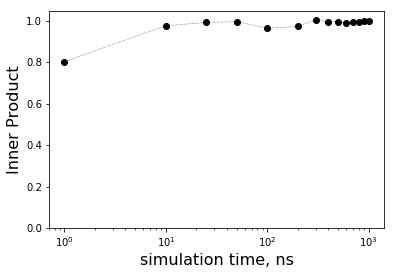

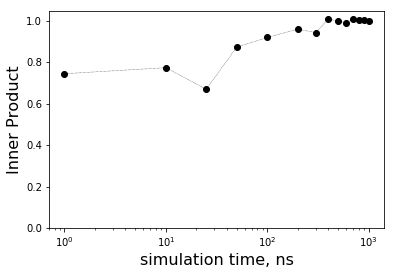

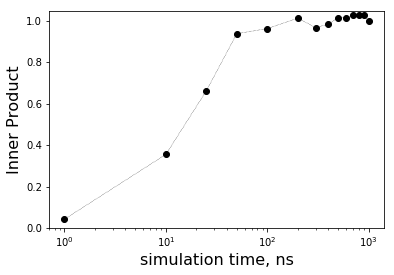

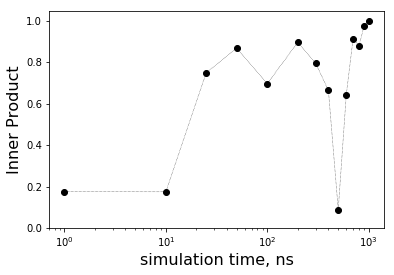

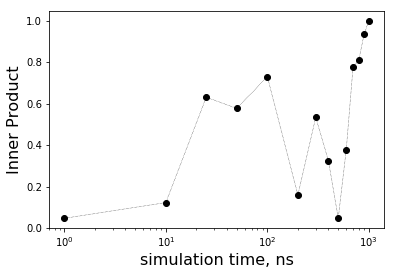

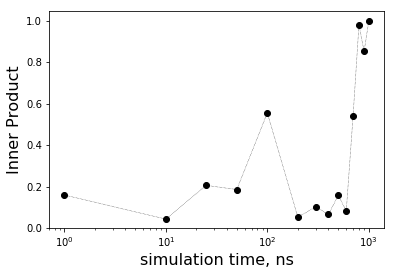

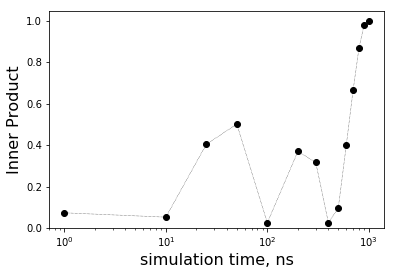

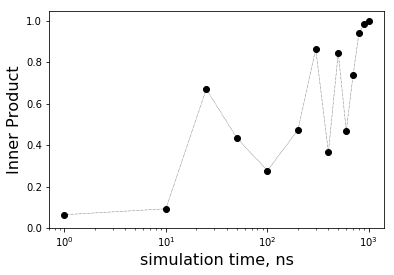

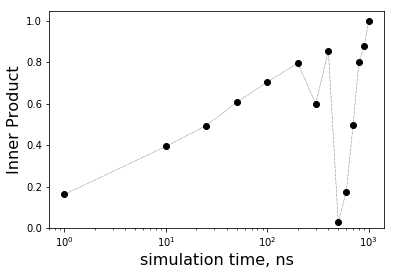

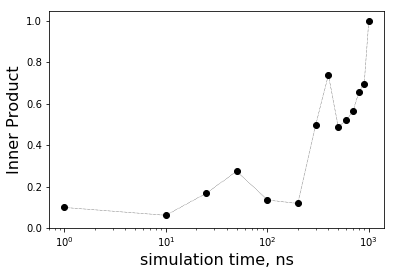

In [205]:
times = [1, 10, 25, 50] + list(range(100, 1100, 100))

Q2 = np.load('../com_HCINVmatrix.npy')
for a in range(10):
    dp_list = np.zeros(len(times))
    for n, i in enumerate(times):
        if i == 1000:
            Q1 = np.load('../com_HCmatrix.npy')
        else:
            Q1 = np.load('../' + str(i) + 'ns/com_HCmatrix.npy')

        dp_list[n] = abs(np.dot(Q1[:,a], Q2[a,:]))
    plt.plot(times, dp_list, lw = 0.5, ls = ":", marker = 'o', c= 'k')
    plt.xscale('log')
    plt.xlabel('simulation time, ns', fontsize = 16)
    plt.ylabel('Inner Product', fontsize = 16)
    plt.ylim((0, 1.05))
    plt.show()
    plt.close()

/home/ebeyerle/bin/anaconda3/envs/pyemma_tutorials/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in arccos
  if sys.path[0] == '':


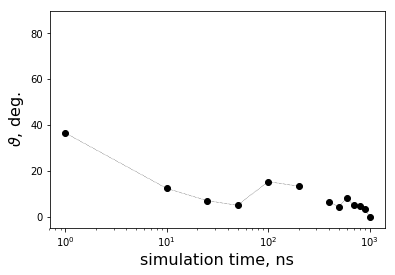

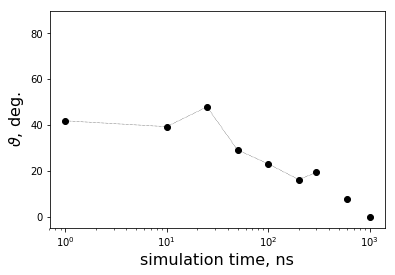

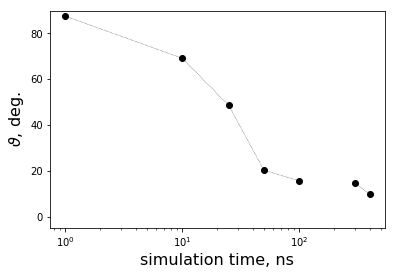

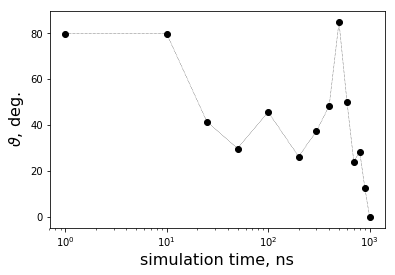

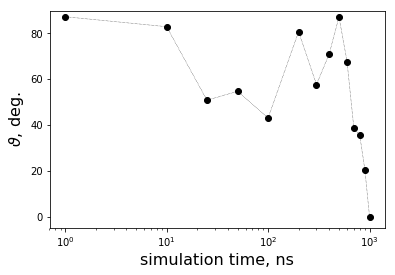

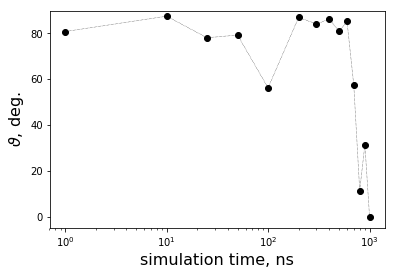

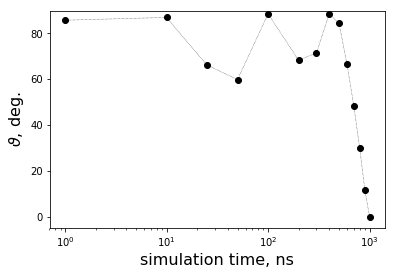

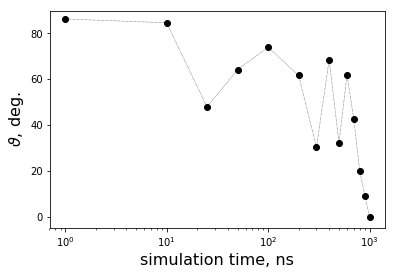

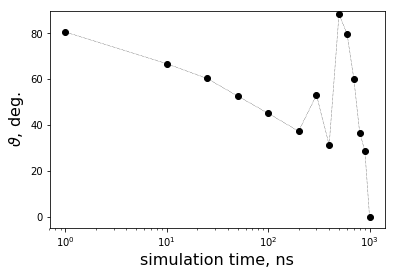

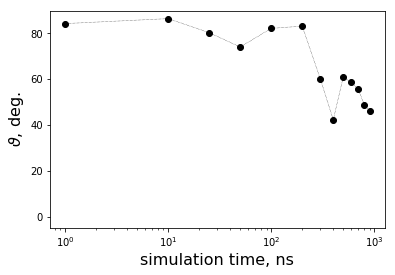

In [225]:
times = [1, 10, 25, 50] + list(range(100, 1100, 100))

Q2 = np.load('../com_HCINVmatrix.npy')
for a in range(10):
    dp_list = np.zeros(len(times))
    for n, i in enumerate(times):
        if i == 1000:
            Q1 = np.load('../com_HCmatrix.npy')
        else:
            Q1 = np.load('../' + str(i) + 'ns/com_HCmatrix.npy')

        dp_list[n] = np.rad2deg(np.arccos(abs(np.dot(Q1[:,a], Q2[a,:]))))
    plt.plot(times, dp_list, lw = 0.5, ls = ":", marker = 'o', c= 'k')
    plt.xscale('log')
    plt.xlabel('simulation time, ns', fontsize = 16)
    plt.ylabel(r'$\vartheta$, deg.', fontsize = 16)
    plt.ylim((-5,90))
    plt.show()
    plt.close()

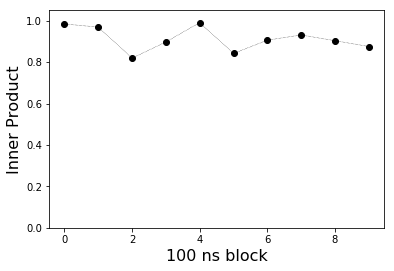

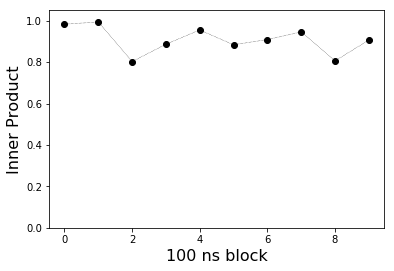

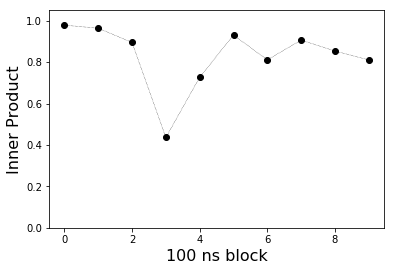

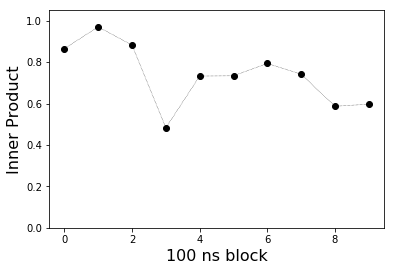

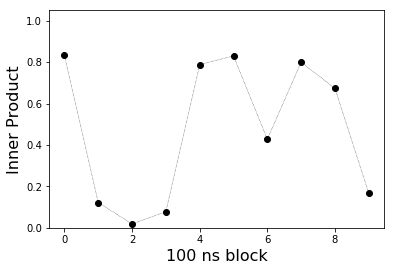

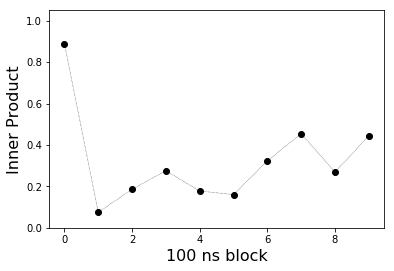

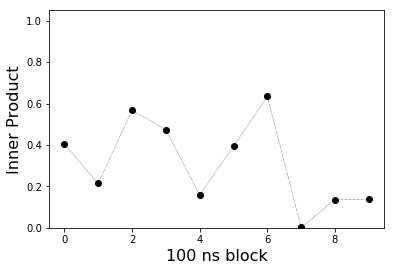

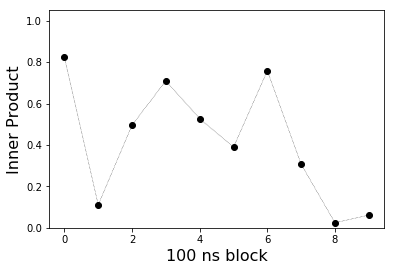

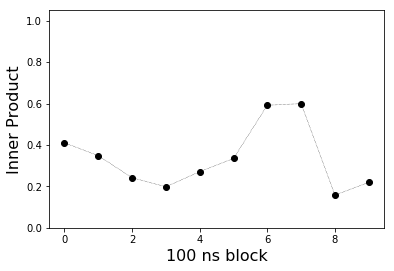

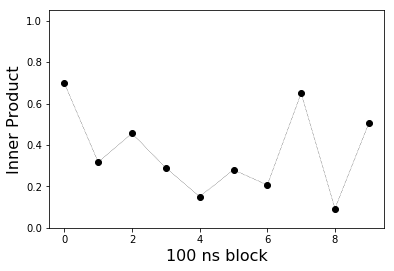

In [220]:
times = list(range(10))

Q2 = np.load('../com_Rmatrix.npy')
for a in range(10):
    dp_list = np.zeros(len(times))
    for n, i in enumerate(range(10)):
        if i == 1000:
            Q1 = np.load('../com_Rmatrix.npy')
        else:
            Q1 = np.load('../chunks/' + str(i + 1) + '/com_Rmatrix.npy')

        dp_list[n] = abs(np.dot(Q1[:,a], Q2[:,a]))
    plt.plot(times, dp_list, lw = 0.5, ls = ":", marker = 'o', c= 'k')
    #plt.xscale('log')
    plt.xlabel('100 ns block', fontsize = 16)
    plt.ylabel('Inner Product', fontsize = 16)
    plt.ylim((0, 1.05))
    plt.show()
    plt.close()

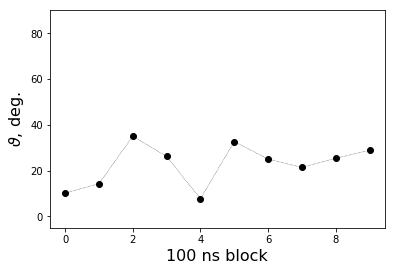

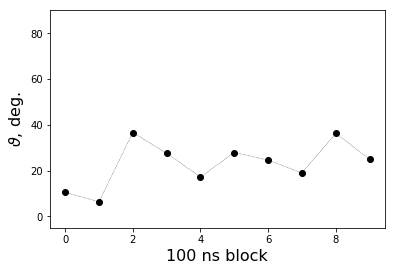

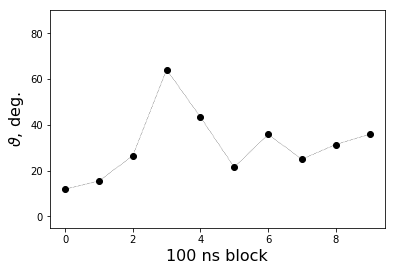

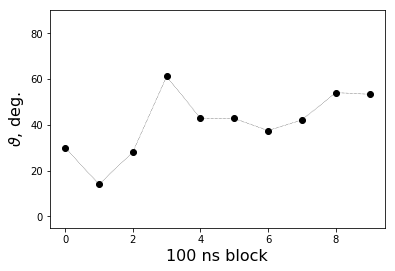

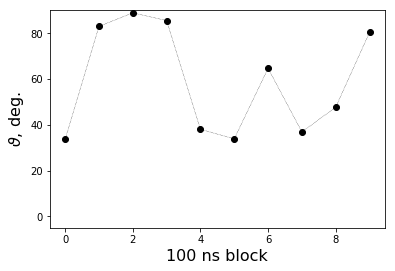

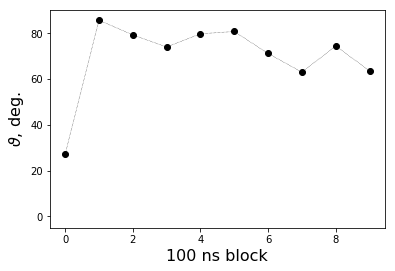

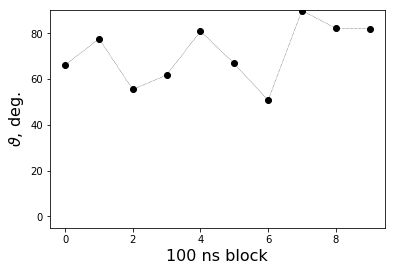

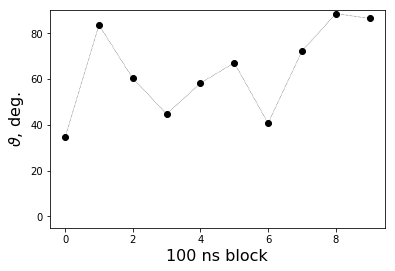

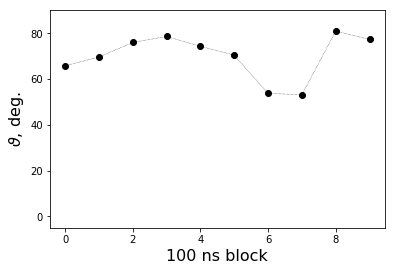

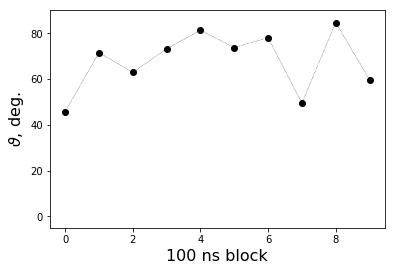

In [224]:
times = list(range(10))

Q2 = np.load('../com_Rmatrix.npy')
for a in range(10):
    dp_list = np.zeros(len(times))
    for n, i in enumerate(range(10)):
        if i == 1000:
            Q1 = np.load('../com_Rmatrix.npy')
        else:
            Q1 = np.load('../chunks/' + str(i + 1) + '/com_Rmatrix.npy')

        dp_list[n] = np.rad2deg(np.arccos(abs(np.dot(Q1[:,a], Q2[:,a]))))
    plt.plot(times, dp_list, lw = 0.5, ls = ":", marker = 'o', c= 'k')
    #plt.xscale('log')
    plt.xlabel('100 ns block', fontsize = 16)
    plt.ylabel(r'$\vartheta$, deg.', fontsize = 16)
    plt.ylim((-5, 90))
    plt.show()
    plt.close()

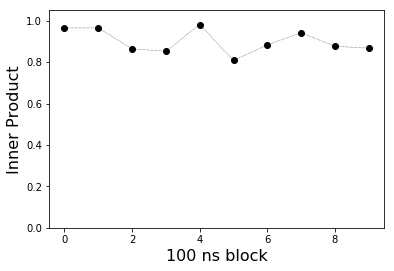

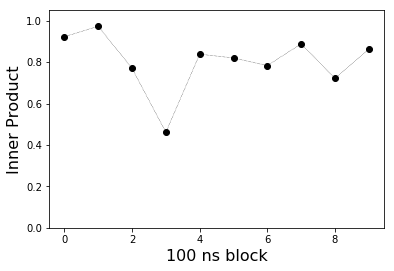

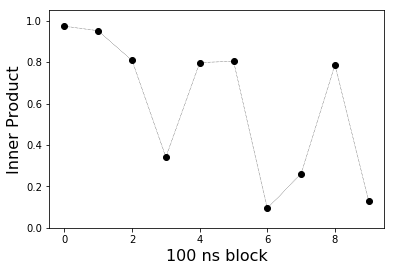

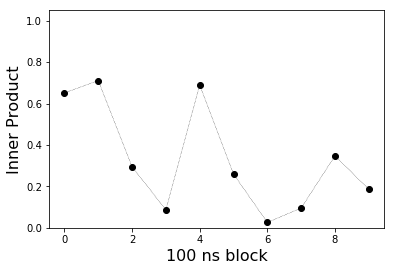

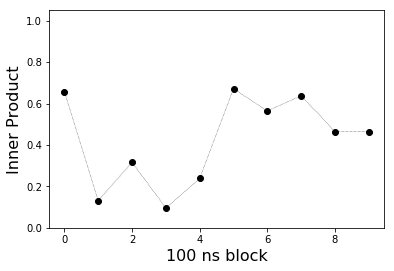

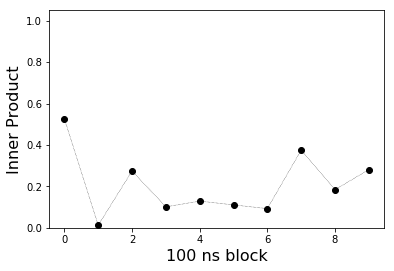

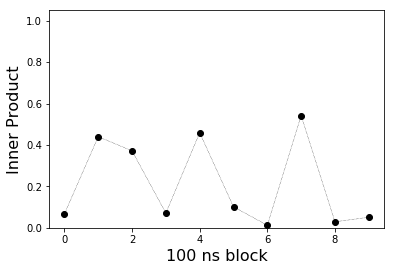

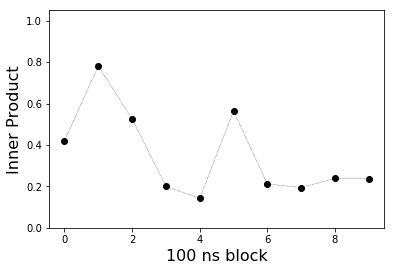

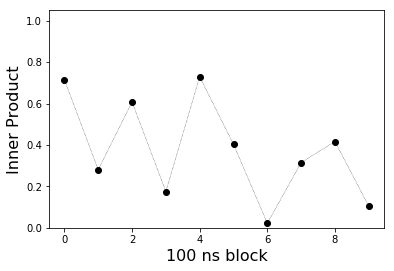

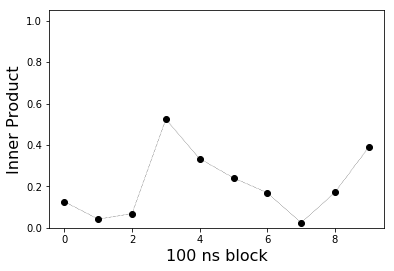

In [227]:
times = list(range(10))

Q2 = np.load('../com_HCINVmatrix.npy')
for a in range(10):
    dp_list = np.zeros(len(times))
    for n, i in enumerate(range(10)):
        if i == 1000:
            Q1 = np.load('../com_HCmatrix.npy')
        else:
            Q1 = np.load('../chunks/' + str(i + 1) + '/com_HCmatrix.npy')

        dp_list[n] = abs(np.dot(Q1[:,a], Q2[a,:]))
    plt.plot(times, dp_list, lw = 0.5, ls = ":", marker = 'o', c= 'k')
    #plt.xscale('log')
    plt.xlabel('100 ns block', fontsize = 16)
    plt.ylabel('Inner Product', fontsize = 16)
    plt.ylim((0, 1.05))
    plt.show()
    plt.close()

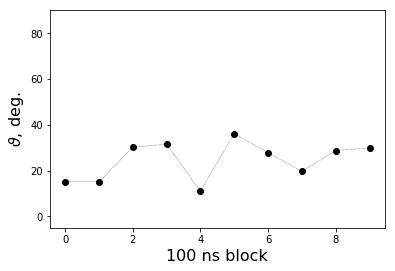

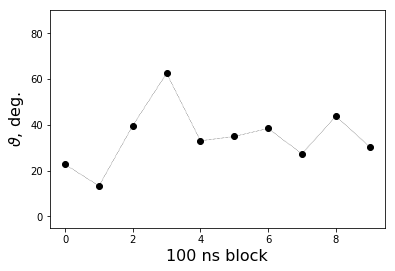

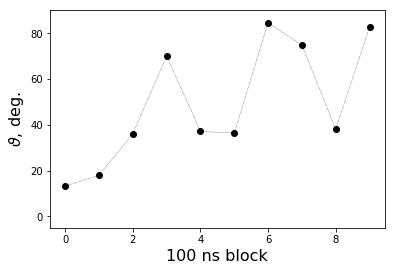

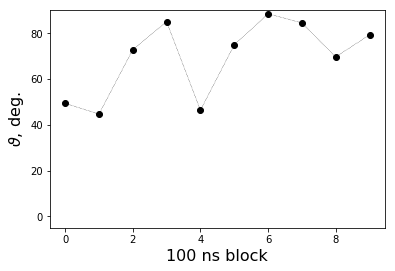

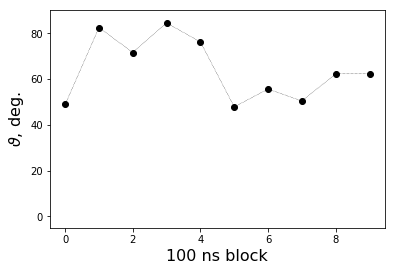

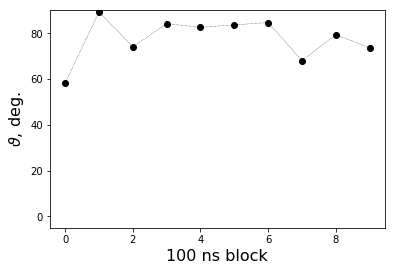

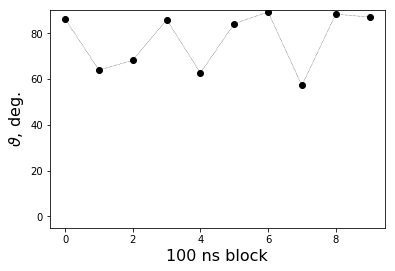

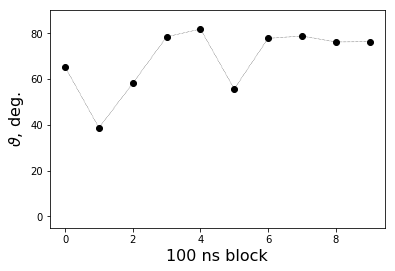

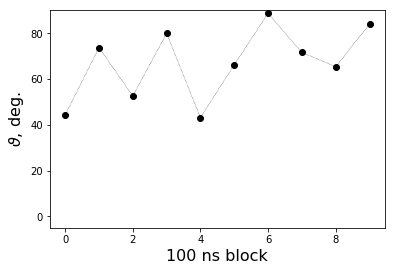

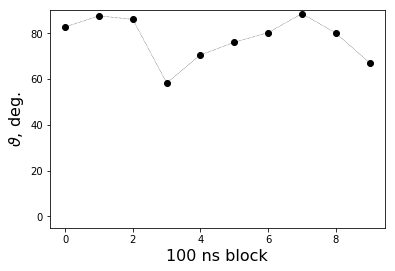

In [228]:
times = list(range(10))

Q2 = np.load('../com_HCINVmatrix.npy')
for a in range(10):
    dp_list = np.zeros(len(times))
    for n, i in enumerate(range(10)):
        if i == 1000:
            Q1 = np.load('../com_HCmatrix.npy')
        else:
            Q1 = np.load('../chunks/' + str(i + 1) + '/com_HCmatrix.npy')

        dp_list[n] = np.rad2deg(np.arccos(abs(np.dot(Q1[:,a], Q2[a,:]))))
    plt.plot(times, dp_list, lw = 0.5, ls = ":", marker = 'o', c= 'k')
    #plt.xscale('log')
    plt.xlabel('100 ns block', fontsize = 16)
    plt.ylabel(r'$\vartheta$, deg.', fontsize = 16)
    plt.ylim((-5, 90))
    plt.show()
    plt.close()

In [12]:
Q1 = np.load('../com_Rmatrix.npy')
Q2 = np.load('../10ns/com_Rmatrix.npy')

xi1 = np.matmul(Q1, traj[:,:50000])
xi2 = np.matmul(Q2, traj[:,:50000])

In [14]:
np.dot(xi1[0,:], xi2[0,:]) / (np.linalg.norm(xi1[0,:])*np.linalg.norm(xi2[0,:]))

0.9628251662656679

In [15]:
np.dot(Q1[:,0], Q2[:,0])

0.9585475391890155

In [18]:
times = [1, 10, 25, 50] + list(range(100, 1100, 100))
Q1 = np.load('../com_Rmatrix.npy')
xi1 = np.matmul(Q1, traj)

ip_list = np.zeros(len(times))
for n, i in enumerate(times):
    print(i)
    Q2 = np.load('../' + str(i) + 'ns/com_Rmatrix.npy')
    
    xi2 = np.matmul(Q2, traj[:,:int(5*i*1000)])
    dummy = xi1[0,:int(5*i*1000)]
    ip_list[n] = np.dot(dummy, xi2[0,:]) / (np.linalg.norm(dummy)*np.linalg.norm(xi2[0,:]))

1
10
25
50
100
200
300
400
500
600
700
800
900
1000


FileNotFoundError: [Errno 2] No such file or directory: '../1000ns/com_Rmatrix.npy'

In [19]:
ip_list[-1] = 1

In [21]:
ip_list

array([-0.99376899,  0.96282517, -0.99381763, -0.92792964,  0.99281861,
       -0.95159173, -0.79203312,  0.57021771,  0.99380559,  0.98980643,
       -0.99208422, -0.97537894, -0.99514144,  1.        ])

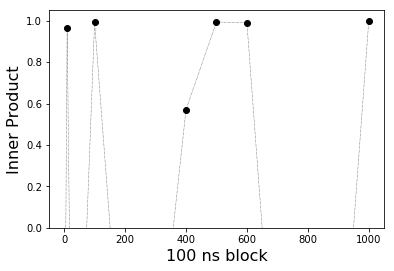

In [20]:
plt.plot(times, ip_list, lw = 0.5, ls = ":", marker = 'o', c= 'k')
#plt.xscale('log')
plt.xlabel('100 ns block', fontsize = 16)
plt.ylabel('Inner Product', fontsize = 16)
plt.ylim((0, 1.05))
plt.show()
plt.close()

In [23]:
times = [1, 10, 25, 50] + list(range(100, 1100, 100))
Q1 = np.load('../com_Rmatrix.npy')
xi1 = np.matmul(Q1, traj)

ip_list = np.zeros(len(times))
for n, i in enumerate(times):
    print(i)
    if i == 1000:
        ip_list[n] = 1
    else:
        Q2 = np.load('../' + str(i) + 'ns/com_Rmatrix.npy')

        xi2 = np.dot(Q2[:,0], traj[:,:int(5*i*1000)])
        dummy = xi1[0,:int(5*i*1000)]
        ip_list[n] = abs(np.dot(dummy, xi2) / (np.linalg.norm(dummy)*np.linalg.norm(xi2)))

1
10
25
50
100
200
300
400
500
600
700
800
900
1000


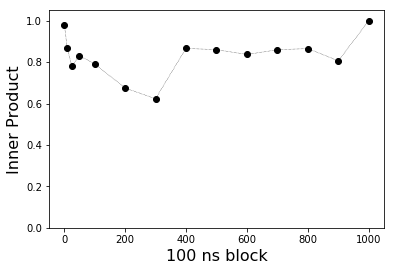

In [24]:
plt.plot(times, ip_list, lw = 0.5, ls = ":", marker = 'o', c= 'k')
#plt.xscale('log')
plt.xlabel('100 ns block', fontsize = 16)
plt.ylabel('Inner Product', fontsize = 16)
plt.ylim((0, 1.05))
plt.show()
plt.close()

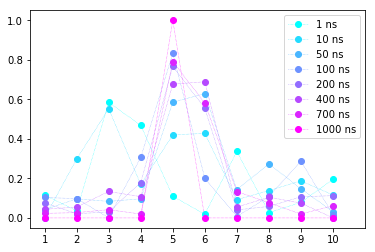

In [31]:
#Mixing of modes 6 and 7, which describe motions in the 50 s loop of ubiquitin
times = [1, 10, 50, 100, 200, 400, 700, 1000]
Q = np.load('../com_Rmatrix.npy')
colors = plt.cm.cool(np.linspace(0, 1, len(times)))
for n, i in enumerate(times):
    if i == 1000:
        QT = np.load('../com_Rmatrix.npy').T
    else:
        QT = np.load('../' + str(i) + 'ns/com_Rmatrix.npy').T
    dp_list = []
    for j in range(QT.shape[1] - 6):
        dp_list.append(np.dot(Q[:,4], QT[j,:]))
    dp_list = abs(np.array(dp_list))
    plt.plot(dp_list[:10], lw = 0.5, ls = ':', marker = 'o', color = colors[n], label = str(i) + ' ns')
    plt.xticks(list(range(1,11)))
    plt.xticks(list(range(10)), labels = list(range(1,11)),)
plt.legend()
plt.show()
plt.close()

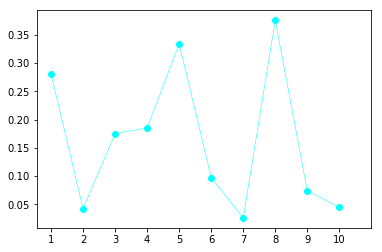

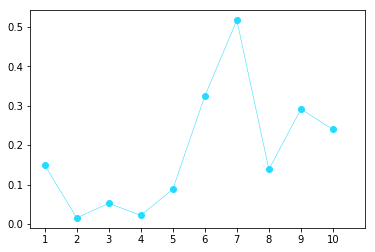

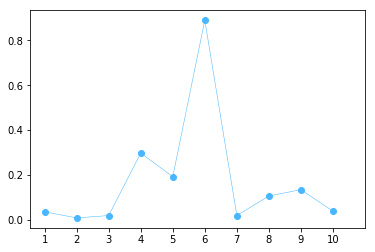

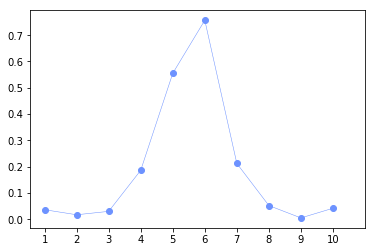

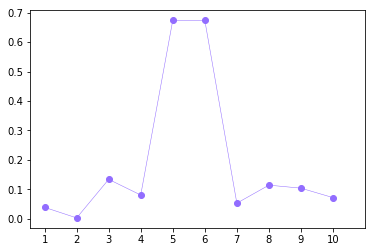

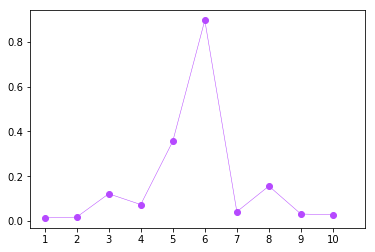

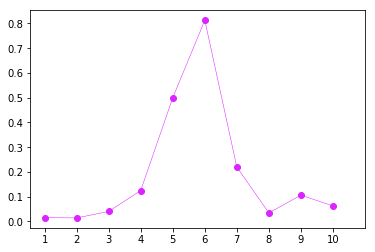

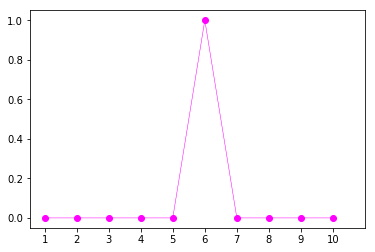

In [21]:
#Mixing of modes 6 and 7, which describe motions in the 50 s loop of ubiquitin
times = [1, 10, 100, 200, 400, 600, 800, 1000]
Q = np.load('../com_Rmatrix.npy')
colors = plt.cm.cool(np.linspace(0, 1, len(times)))
for n, i in enumerate(times):
    if i == 1000:
        QT = np.load('../com_Rmatrix.npy').T
    else:
        QT = np.load('../' + str(i) + 'ns/com_Rmatrix.npy').T
    dp_list = []
    for j in range(QT.shape[1] - 6):
        dp_list.append(np.dot(Q[:,5], QT[j,:]))
    dp_list = abs(np.array(dp_list))
    plt.plot(dp_list[:10], lw = 0.5, marker = 'o', color = colors[n])
    plt.xticks(list(range(1,11)))
    plt.xticks(list(range(10)), labels = list(range(1,11)),)
    plt.show()
    plt.close()

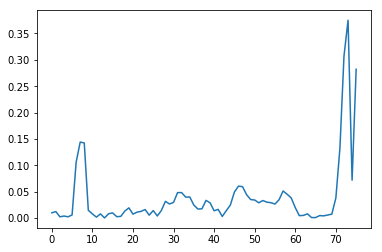

In [38]:
plt.plot(abs(Q[::3,5]))

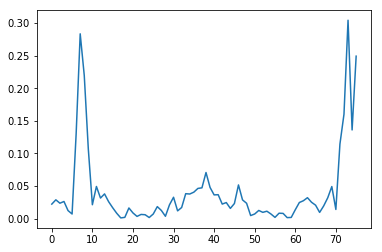

In [39]:
plt.plot(abs(Q[1::3,5]))

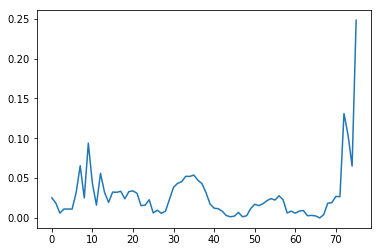

In [40]:
plt.plot(abs(Q[2::3,5]))